In [68]:
### IMPORT EXTERNAL FUNCTIONS
import mne
import numpy as np
from os.path import join
import os
import glob
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
from mne.preprocessing import ICA, read_ica
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
from mne.preprocessing import corrmap, create_ecg_epochs, create_eog_epochs

# import sys
# from pathlib import Path
# parent_dir = Path.cwd().parent
# sys.path.append(str(parent_dir))

os.getcwd()
import functions.io as io
import functions.utils as utils


### Overview

- Loads data (single sub)
- Checks unit of raw data (without any manipulation of raw, just checking)
- Dropping channels that aren't of interest, and setting channel types (you will want to keep X.Y,Z channels though!)
- Re-scales data and replaces raw (if check above suggests that data is in "raw units ADC" from amplifier. If one needs to be rescaled all do, but I keep the check in here just so I/we know what's going on and why we're rescaling)
- Set montage (so that each electrode has it's location when we use scalp tophographies for visualisations and electrode placement (and later for other stuff I assume))
- High- and low-pass filter + notch filter
- Annotate breaks, so that beginning, breaks between blocks, and end isn't included in the analyses. I found that if we crop the event timings get shifted, if we just annotate here then we don't shift any times and events around, and the "bad" parts are not included in analyses.
- Plot raw trace and manually annotate bad parts of raw trace (I think only the most obvious movements/artefacts with huge shifts amplitude). Annotating can be done when seeing raw traces interactivately, click "a" on keybord to get the "helper/info" and then type "movement" straight away and hit enter. This creates a new "marker" which you then use to mark bad segments (click and drag over the bad segments). Also remove obviously bad channels here (more info at that stage).
- Following this, when the obviously bad movements/artefacts/channels are removed, we can run some checks on channels to check if they are likely to be bad or not - see more info at that point in the notebook. I still don't know what's "appropriate" to do here, but the code is there if useful, and if the results can be used to guide selection of channels?
- After all removal -> re-reference to average
- Run ICA and save it so I don't need to re-run it later (if everything is identical in preprocessing), but can load it and apply it to the data again with e.g., other components removed etc. 
- Plot ICA components to see topographies, time series of components, how much variance is explained by the components etc (I don't really understand this variance fully, what is good and what is bad? Is there a good and bad?). Then some mne functions that "automatically" suggests which components are likely to be ECG, EOG, and mostly muscle noise. I think for now i prefer to do it manually, and use these checks as guides and compare to what I think the components are - see more notes at that point in the notebook.
- Select bad components and remove them 
- Apply the ICA to data
- After this the preprocessing of raw data is done. 


I then have parts where I epoch the data, and then remove bad epochs (the parts I have previously marked as bad are still in the data, because when I load the epochs I tell it to also include what segments of the raw trace I marked as bad to be excluded. I found that if I exclude the "bad_movement" I marked manually before ICA, all my epoch indexes are shifted because parts of the data has been removed, so the behavioural file index and actual remaining data indexes are not matching and I'm pulling the wrong epochs in my extract epoch functions. By keeping the "bad_movement" data in when I extract epochs, no data is removed when epochs are created, so I will have to quickly go over and just remove those that are bad again). This could probably be done in a smoother way, but I don't find this too annyoing to do, at epoch level it doesn't take too long to quickly scan through. 


I plot (and save) PSDs regularly to see what the impact the different preprocessing steps have. Might not be necessary later on - but for now i find it ok. 
I also save the file after some steps (it is marked when saved), so that the steps that takes long/are tedious don't have to be re-done all the time if wanting to test different methods etc. 

In [ ]:
# Session to preprocess
session_id = "sub015 DBS OFF mSST"

working_path = os.path.dirname(os.getcwd())
onedrive_path = utils._get_onedrive_path()

sub = session_id.split(' ') [0]
condition = session_id.split(' ') [1] + ' ' + session_id.split(' ') [2]
sub_onedrive_path_task = join(onedrive_path, sub, 'synced_data', session_id)

#  Set saving path
results_path = join(working_path, "results")
saving_path = join(results_path, session_id)
if not os.path.isdir(saving_path):
    os.makedirs(saving_path)

# Load raw data
filename = [f for f in os.listdir(sub_onedrive_path_task) if (
    f.endswith('.set') and f.startswith('SYNCHRONIZED_EXTERNAL'))] # LOADING UNSCALED DATA
file = join(sub_onedrive_path_task, filename[0])
#raw = mne.io.read_raw(file, preload=True)
raw = mne.io.read_raw(file, preload=True) # only for eeg data, not for LFPs

sf = raw.info['sfreq']
print(f"Sampling frequency: {sf} Hz")


Sampling frequency: 2047.9428556760452 Hz


#### Set channel types for BIP and drop useless extra channels

In [3]:
# We want to drop channels we're not interested in first, because applying scaling factor to non-EEG channels
# doesn't necessarily make sense
raw.drop_channels(['CREF', 'X', 'Y', 'Z', 'TRIGGERS', 'STATUS', 'COUNTER', 'BIP 01'])
raw.set_channel_types({'BIP 02': 'ecg', 'BIP 03': 'eog'}) 

<RawEEGLAB | SYNCHRONIZED_EXTERNAL_sub-015_ses-mSST_OFF_task-Default_run-001_eeg.set, 34 x 3792872 (1852.0 s), ~983.9 MB, data loaded>

##### Set montage


In [4]:
data = raw.set_montage('standard_1020', match_case=False, match_alias=True, on_missing='warn') 

#### Plot raw PSD

Effective window size : 1.000 (s)
Plotting power spectral density (dB=True).


c:\Users\Juliette\anaconda3\envs\ephy\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


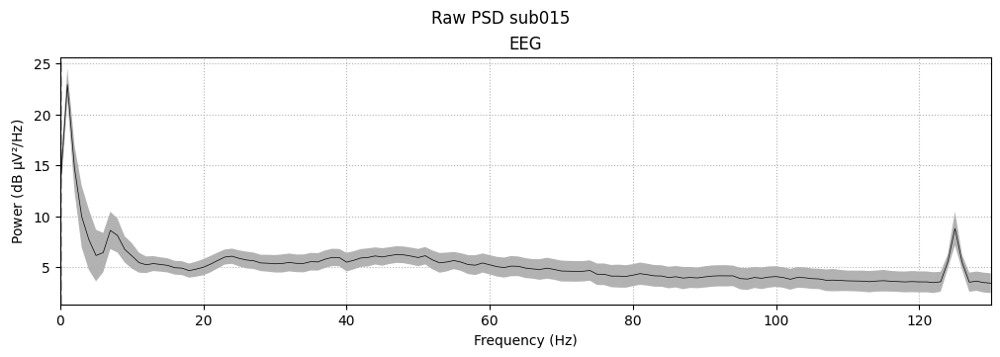

Effective window size : 1.000 (s)
Plotting power spectral density (dB=True).


c:\Users\Juliette\anaconda3\envs\ephy\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


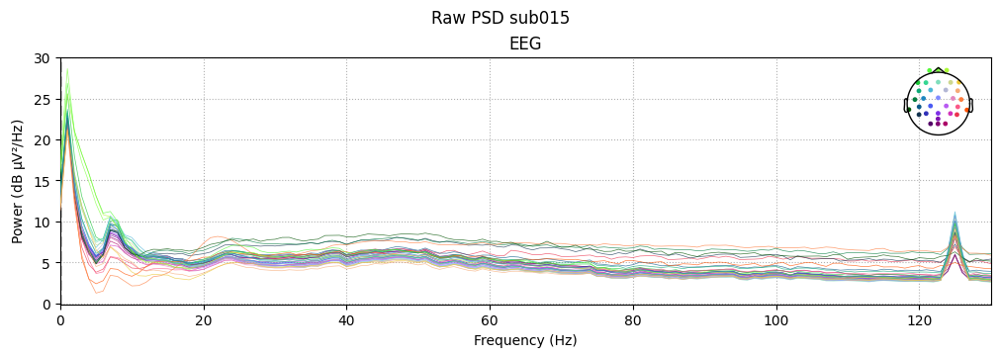

In [5]:
%matplotlib inline

### Plot PSD of signal (averaging all channels)
psd_raw_avg = data.compute_psd(method="welch", picks="eeg", fmin=0, fmax=130, n_fft=round(sf), n_overlap=int(round(sf)/2), window="hamming")
psd_raw_avg.plot(dB=True, average=True).suptitle(f"Raw PSD {sub}")
plt.show()

### Plot PSD of signal (not averaging)
psd_raw = data.compute_psd(method="welch", picks="eeg", fmin=0, fmax=130, n_fft=round(sf), n_overlap=int(round(sf)/2), window="hamming")
psd_raw.plot(dB=True, average=False).suptitle(f"Raw PSD {sub}")
sub_save_path = join(saving_path, "sub_data", f"{sub}", "figures", "PSDs")
os.makedirs(sub_save_path, exist_ok=True)  # Create the directory if it doesn't exist
plt.savefig(join(sub_save_path, f"{sub}_raw_PSD_avg.png"), dpi=300)
plt.show()

In [ ]:
%matplotlib qt

data.plot(scalings="auto", title="Raw data")

### High- and low-pass filtering + notch

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 6759 samples (3.300 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    2.1s
[Parallel(n_jobs=1)]: Done  32 out of  32 | elapsed:    3.8s finished


Filtering raw data in 1 contiguous segment
Setting up low-pass filter at 80 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal lowpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Upper passband edge: 80.00 Hz
- Upper transition bandwidth: 20.00 Hz (-6 dB cutoff frequency: 90.00 Hz)
- Filter length: 339 samples (0.166 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    2.2s
[Parallel(n_jobs=1)]: Done  32 out of  32 | elapsed:    3.9s finished


Using matplotlib as 2D backend.


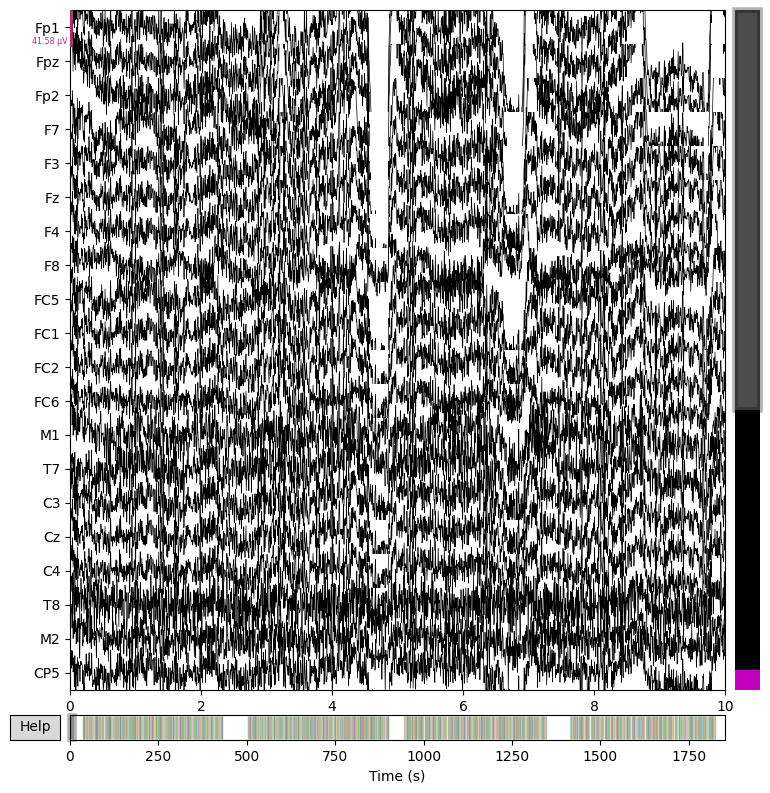

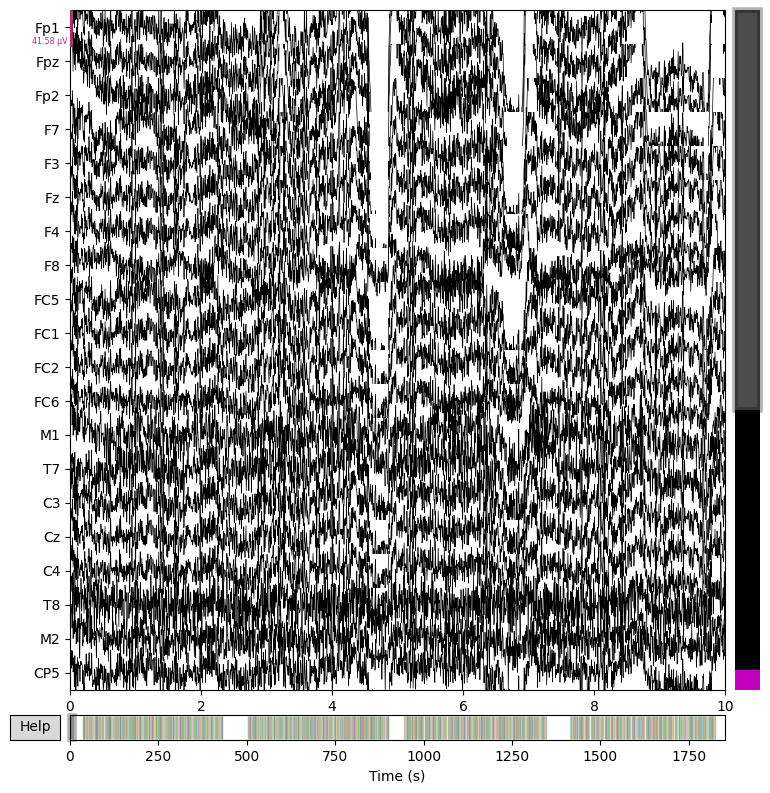

In [6]:
high_passed_filt_eeg_data = data.copy().filter(1,None) # first apply 1Hz high pass filter
high_low_passed_filt_eeg_data = high_passed_filt_eeg_data.copy().filter(None, 80) # then apply 80Hz low pass filter
# Plot filtered data
high_low_passed_filt_eeg_data.plot(scalings="auto", title="Filtered data")

#### Plot PSD after filtering

Effective window size : 1.000 (s)
Plotting power spectral density (dB=True).


c:\Users\Juliette\anaconda3\envs\ephy\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


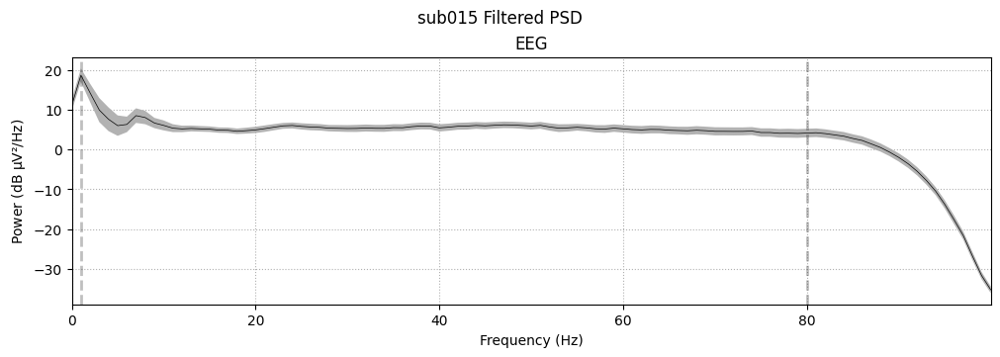

Effective window size : 1.000 (s)
Plotting power spectral density (dB=True).


c:\Users\Juliette\anaconda3\envs\ephy\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


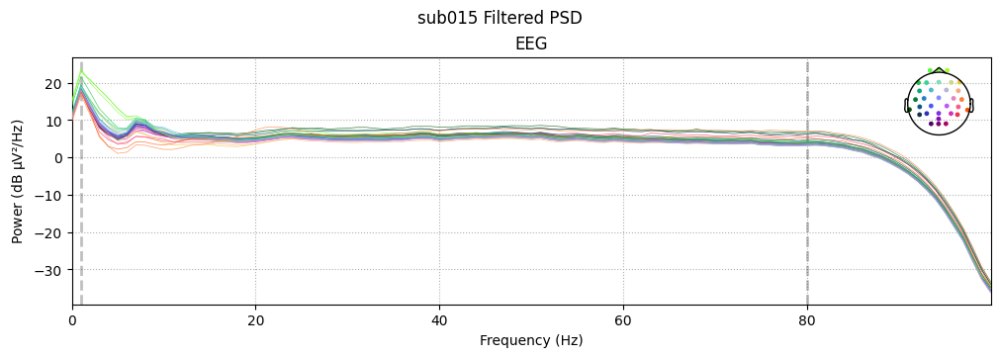

In [7]:
%matplotlib inline

### Plot PSD of signal (averaging all channels)
psd_filt_avg = high_low_passed_filt_eeg_data.compute_psd(method="welch", picks="eeg", fmin=0, fmax=100, n_fft=round(sf), n_overlap=int(round(sf)/2), window="hamming")
psd_filt_avg.plot(dB=True, average=True).suptitle(f"{sub} Filtered PSD")
plt.show()

### Plot PSD of signal (not averaging)
psd_filt = high_low_passed_filt_eeg_data.compute_psd(method="welch", picks="eeg", fmin=0, fmax=100, n_fft=round(sf), n_overlap=int(round(sf)/2), window="hamming")
psd_filt.plot(dB=True, average=False).suptitle(f"{sub} Filtered PSD")
plt.show()

In [8]:
notch_filt_eeg_data = high_low_passed_filt_eeg_data.copy().notch_filter(50) # if needed, add notch filter at 50Hz
# Actually, even if 50Hz activity is not present here, it is sometimes present after re-referencing, so it is safer to apply it?

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 13517 samples (6.600 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    2.1s
[Parallel(n_jobs=1)]: Done  32 out of  32 | elapsed:    3.9s finished


In [9]:
# Here choose which data to continue with (with or without notch)
filt_eeg_data = notch_filt_eeg_data.copy()  # Use this if you want to keep the notch filter
#filt_eeg_data = high_low_passed_filt_eeg_data.copy() # Use this if you want to skip the notch filter

Resample data

In [10]:
# Downsample to save computation time, but keep the original events to not loose time precision!!
ds_freq = 200  # Desired downsampling frequency
events, event_id = mne.events_from_annotations(raw, use_rounding=False)
downsampled_data, downsampled_events = filt_eeg_data.copy().resample(sfreq=ds_freq, npad='auto', events = events)

Used Annotations descriptions: ['GC', 'GF', 'GO', 'GS', 'continue', 'late', 'resp', 'stop']


Effective window size : 1.000 (s)
Plotting power spectral density (dB=True).


c:\Users\Juliette\anaconda3\envs\ephy\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


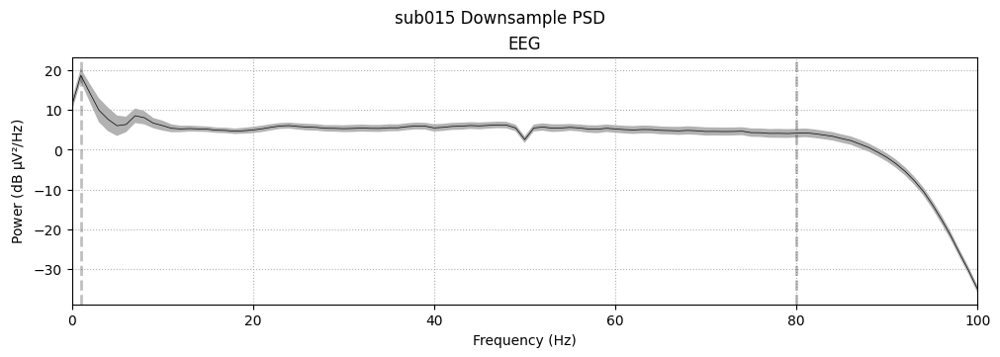

Effective window size : 1.000 (s)
Plotting power spectral density (dB=True).


c:\Users\Juliette\anaconda3\envs\ephy\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


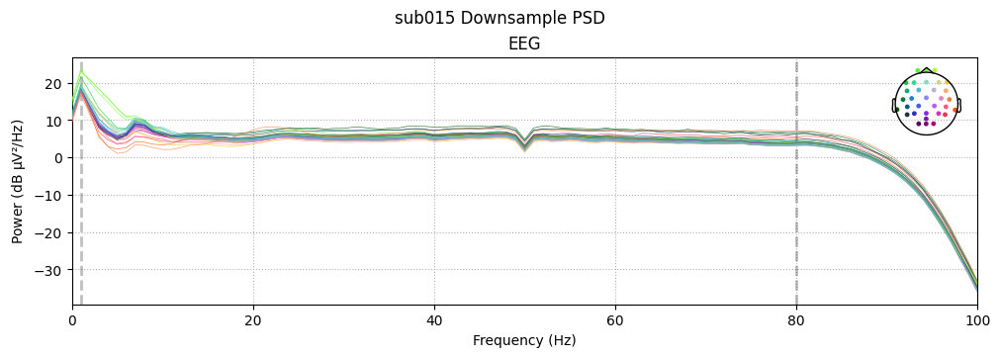

In [11]:
%matplotlib inline

### Plot PSD of signal (averaging all channels)
psd_filt_avg = downsampled_data.compute_psd(
    method="welch", picks="eeg", 
    fmin=0, 
    fmax = int(ds_freq/2), # plot until Nyquist based on the new sampling frequency after downsampling
    n_fft=ds_freq, # 1 second windows
    n_overlap=int(ds_freq/2), # overlap of half a second
    window="hamming"
    )
psd_filt_avg.plot(dB=True, average=True).suptitle(f"{sub} Downsample PSD")
plt.show()

### Plot PSD of signal (not averaging)
psd_filt = downsampled_data.compute_psd(method="welch", picks="eeg", fmin=0, fmax = int(ds_freq/2), n_fft=ds_freq, n_overlap=int(ds_freq/2), window="hamming")
psd_filt.plot(dB=True, average=False).suptitle(f"{sub} Downsample PSD")
plt.show()

# Here the fmax can't exceed the Nyquist frequency, which is half of the new sampling frequency (i.e. 160/2 = 80Hz).

#### Annotating breaks
Breaks are recognised by time without event markers.
- Min_break_duration: How long time must be between event markers for this to be considered a break.
- t_start_after_previous & t_start_before_next: How many seconds should be after the last event marker before the break starts, and how many seconds before the first event marker should the break stop. 

In [12]:
break_annot = mne.preprocessing.annotate_break(downsampled_data, min_break_duration=10, t_start_after_previous=4, t_stop_before_next=4)


Ignoring annotations with descriptions starting with: bad, edge

Detected 5 break periods of >= 10 s duration:
    0.0 – 31.9 s [31.9 s]
    434.1 – 499.1 s [65.0 s]
    903.6 – 940.7 s [37.2 s]
    1350.0 – 1411.1 s [61.0 s]
    1827.4 – 1852.0 s [24.7 s]
In total, 11.9% of the data (219.8 s) have been marked as a break.



In [13]:
### Add the breaks to the annotations of the data
#filt_eeg_break_data = []
#
downsampled_break_data = downsampled_data.set_annotations(raw.annotations + break_annot)

##### Visual check to see break is added at the correct places

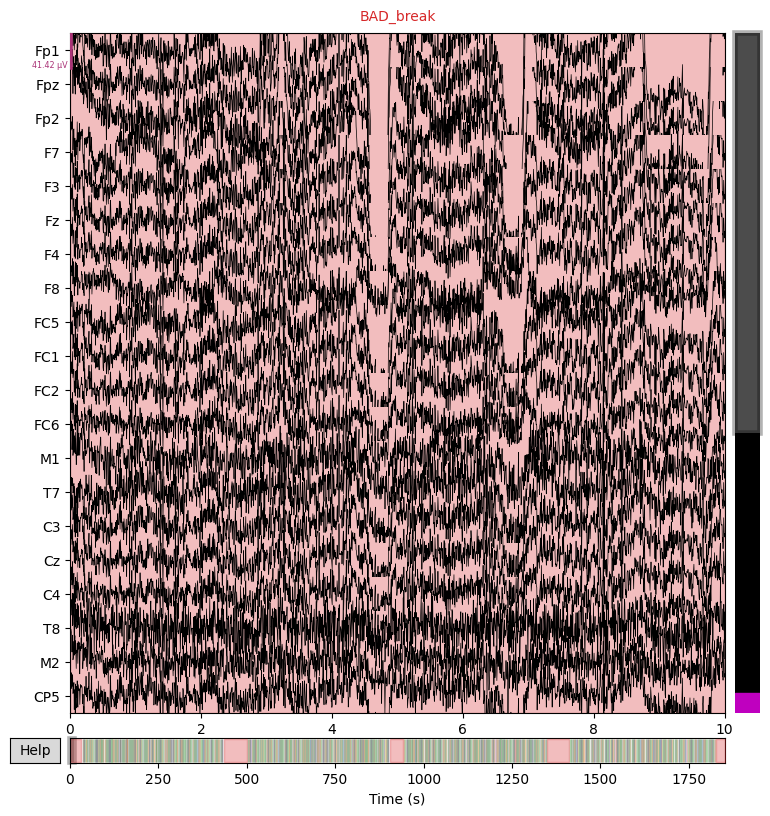

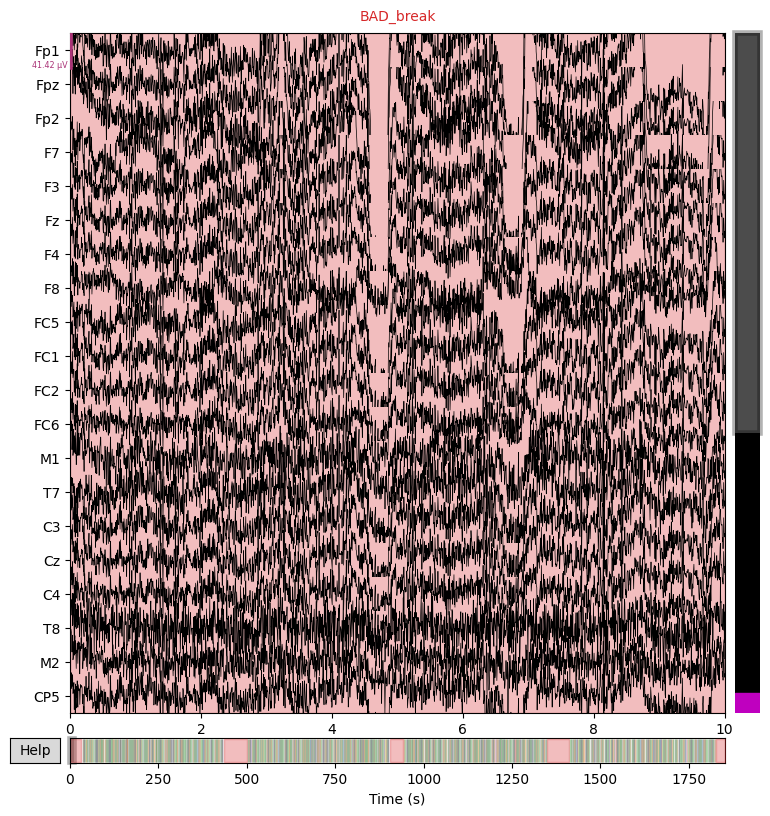

In [14]:
%matplotlib inline

# Plot signal (can check timeline on x-axis. The red blocks (break) should be where there are no event marker lines)
downsampled_break_data.plot(scalings="auto", title="Breaks added")

#### Plot PSD again - now breaks are not included in the PSD
Depending on how much data has been excluded (i.e. how long the breaks were), and how much artefacts due to movement etc. were in the breaks, the PSD will look more or less like the PSD from before annotating breaks. 

However, it is good to remove breaks from the data when we re-reference to average - we don't want the break activity to influence the average signal.

Setting 43960 of 370408 (11.87%) samples to NaN, retaining 326448 (88.13%) samples.
Effective window size : 10.240 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.
Plotting power spectral density (dB=True).


c:\Users\Juliette\anaconda3\envs\ephy\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


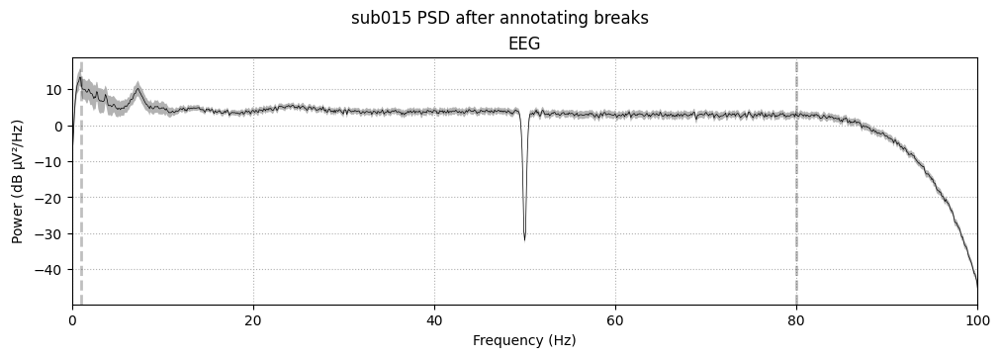

Setting 43960 of 370408 (11.87%) samples to NaN, retaining 326448 (88.13%) samples.
Effective window size : 10.240 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.
Plotting power spectral density (dB=True).


c:\Users\Juliette\anaconda3\envs\ephy\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


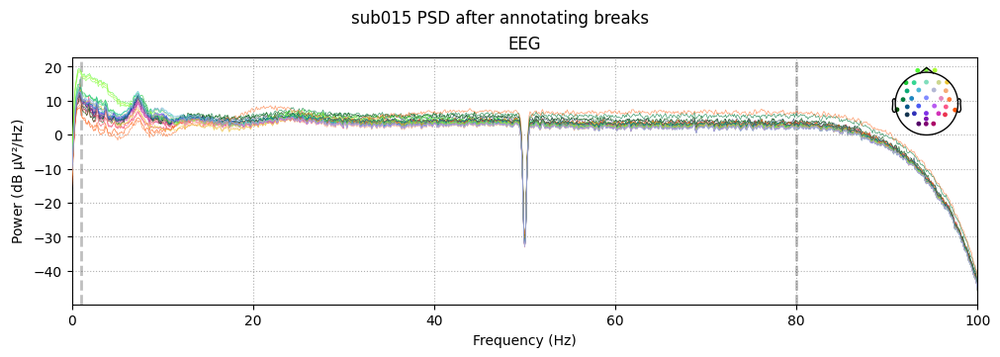

In [15]:
%matplotlib inline

#%matplotlib qt

### Plot PSD of signal (averaging all channels)
psd_noBreak_avg = downsampled_break_data.compute_psd(method="welch", picks="eeg", fmin=0, fmax=ds_freq/2, window="hamming")
psd_noBreak_avg.plot(dB=True, average=True).suptitle(f"{sub} PSD after annotating breaks")
plt.show()

### Plot PSD of signal (not averaging)
psd_noBreakfilt = downsampled_break_data.compute_psd(method="welch", picks="eeg", fmin=0, fmax=ds_freq/2, window="hamming")
psd_noBreakfilt.plot(dB=True, average=False).suptitle(f"{sub} PSD after annotating breaks")
sub_save_path = join(saving_path, "sub_data", f"{sub}", "figures", "PSDs")
plt.savefig(join(sub_save_path, f"{sub}_filtered_noBreak_PSD.png"), dpi=300)
plt.show()

#### Plot data and identify (select by clicking on them) bad channels AND annotate bad segments (e.g., movement artefacts) before re-referencing to average
Noisy channel identification can also be guided by the PSD above (plotting it interactively you can hover over the channels and get their names). Remove the ones which are clearly way below or above the main groupings of channels (but not frontal ones, they are likely eyeblinks in the lower frequencies). Don't be too strict in removing channels I think - the removing is still something I'm not sure how to best approach. We don't want to remove too much, because then ICA will be bad because we have removed all "noise", but we also want to remove channels that are clearly flat, or only noise. 

After artefact removal, the file is saved.

In [16]:
%matplotlib qt

# Plot raw signal
downsampled_break_data.plot(n_channels = len(downsampled_break_data.info['ch_names']), duration = 20, scalings="auto", block=True) # Cell block waits for plot to be closed before continuing (i.e., saving)

save_path = os.path.join(saving_path, "sub_data", f"{sub}", "data")
os.makedirs(save_path, exist_ok=True)  # Create the directory if it doesn't exist

file_p = join(save_path, f"{sub.replace(' ', '_')}_artefacts_removed_EEGdata_eeg.fif")
downsampled_break_data.save(file_p, overwrite=True)

Channels marked as bad:
['T8']
Overwriting existing file.
Writing c:\Users\Juliette\Research\Projects\analysis_mSST\results\sub015 DBS OFF mSST\sub_data\sub015\data\sub015_artefacts_removed_EEGdata_eeg.fif
Closing c:\Users\Juliette\Research\Projects\analysis_mSST\results\sub015 DBS OFF mSST\sub_data\sub015\data\sub015_artefacts_removed_EEGdata_eeg.fif
[done]


##### If already removed artefacts, load file from previous session so we don't need to repeat these steps

In [ ]:
# temp_sub = sub.replace(' ', '_')
# filename = join(saving_path, "sub_data", sub, "data", f"{temp_sub}_artefacts_removed_EEGdata_eeg.fif")

# filt_eeg_break_data = mne.io.read_raw(filename, preload=True)

### Recognising bad channels by Z-scoring and looking at SD and variance in freq. and time domain

**PSD_Z:**
- Computes each channel’s average power (1–90 Hz) in dB, then z-scores across channels—so it flags electrodes whose overall spectral “bulk” is unusually high or low (e.g., a consistently noisy or dead contact) (A single value per channel, tells us whether the channel is generally noisier or quieter than the others) (looks at Frequency domain).

**P2P_Z:**
- Measures the maximum 250 ms peak-to-peak excursion per channel and z-scores those values—so it catches electrodes with extreme transients (cable pops, big spikes) or abnormally flat signals (looks at Time domain)
(Takes the highest voltage the channel reaches minus the lowest voltage it reaches—that difference is its peak-to-peak value.)

**Corr_Z:**
- Computes each channel’s mean Pearson correlation to all other channels, then z-scores—so it flags sensors that aren’t co-varying with the head (e.g., drifty or disconnected channels, channels that don't correlate with their neighbours).

**Var_Z:**
- Takes each channel’s overall variance and z-scores—so it highlights electrodes that are unusually “spiky” or “quiet” over the whole recording (looks at Time domain).

**Max_Freq_Z:**
- Looks for the largest per-frequency deviation (in z-units) from the grand mean spectrum—so it catches narrowband bursts (line-noise leakage, muscle peaks) that might be lost in the broad PSD average (=For each frequency bin look at how many SD above/below the across-channel mean power that channel’s power is at that exact frequency (i.e. a z-score at 10 Hz, at 20 Hz, etc.), and take whichever of those frequency-specific z-scores is largest in absolute value. That way, even if a channel’s overall PSD looks okay, a single narrowband spike (say a 50 Hz line-noise leak or a muscle peak at 80 Hz) will make its “max_freq_z” jump out.) (looks at Frequency domain).

#### Rule of thumb:
- If it fails two or more of the checks, probably bad - but do a visual check of PSD and raw trace
- Failing one check: Look at PSD and raw trace - if looking good, keep it in

**NOTE** Frontal channels can often be flagged, but that is likely because of eyeblinks, so don't necessarily remove them if the raw trace itself looks ok besides the eyeblink!

Setting 43960 of 370408 (11.87%) samples to NaN, retaining 326448 (88.13%) samples.
Effective window size : 0.800 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.
>> PSD outliers (|z|>2.5): ['T7']
>> Peak-to-peak outliers (|z|>2.5): ['Fpz', 'Fp2']
>> Low-correlation outliers (corr_z < -2.5): []
>> Variance outliers (|z|>2.5): ['Fp1', 'Fpz']
>> Spectral‐spike outliers (max_freq_z>2.5): ['Fp1', 'Fp2', 'F8', 'M1', 'T7', 'M2']
>> Final flagged channels: ['Fp1', 'Fpz', 'Fp2', 'F8', 'M1', 'T7', 'M2']
   Channel  PSD_Z  P2P_Z  Corr_Z  Var_Z  Max_Freq_Z  Flagged
0      Fp1   1.80   1.20   -1.54   2.67        2.77     True
1      Fpz   0.48   2.97   -2.48   3.15        2.35     True
2      Fp2   0.91   3.58   -2.01   2.23        2.62     True
3       F7   0.91   0.50   -0.32   1.08        1.14    False
4       F3   0.05  -0.23    0.54   0.04        1.49    False
5       Fz  -0.44  -0.48    0.65  -0.32        1.44   

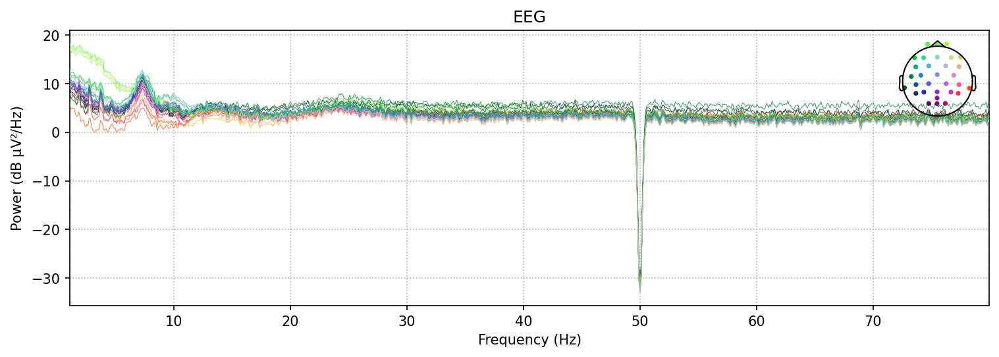

In [17]:
%matplotlib qt

# rename for readability
bad_chan_identifier = downsampled_break_data  

# pick only the EEG channels that aren’t already in raw.info['bads']
picks = mne.pick_types(bad_chan_identifier.info, meg=False, eeg=True, exclude='bads')

sfreq = bad_chan_identifier.info['sfreq']

# Frequency-domain PSD checks
psd_container = bad_chan_identifier.compute_psd(
    method="welch",
    picks=picks,
    fmin=1.0,
    fmax=80.0,
    n_fft=160,
    window="hamming"
)

# Convert to dB and compute mean PSD per channel
psds     = psd_container.get_data()     # (n_picks, n_freqs)
psd_db   = 10 * np.log10(psds)
mean_psd = psd_db.mean(axis=1)
psd_z    = (mean_psd - mean_psd.mean()) / mean_psd.std()

# Peak-to-peak amplitude in 250 ms windows
data = bad_chan_identifier.get_data(picks=picks)     # (n_picks, n_times)
win_samp = int(0.25 * sfreq)
n_win    = data.shape[1] // win_samp
p2p_mat  = np.zeros((len(picks), n_win))
for w in range(n_win):
    seg = data[:, w*win_samp:(w+1)*win_samp]
    p2p_mat[:, w] = seg.max(axis=1) - seg.min(axis=1)
max_p2p = p2p_mat.max(axis=1)
p2p_z   = (max_p2p - max_p2p.mean()) / max_p2p.std()

# Channel–channel correlation 
corr      = np.corrcoef(data)
mean_corr = corr.mean(axis=0)
corr_z    = (mean_corr - mean_corr.mean()) / mean_corr.std()

# Compute time-domain variance per channel and z-score
# Flags channels with too much or too little amplitude variability over the rec (relative to the other electrodes),
# i.e., it could be flat or very spiky
chan_vars = np.var(data, axis=1)
var_z     = (chan_vars - chan_vars.mean()) / chan_vars.std()

# Compute frequency-wise z-scores and max deviation per channel
# Looks for channels which have high spikes in some frequencies, could indicate e.g., line noise or muscle artefact
mean_freq   = psd_db.mean(axis=0)
std_freq    = psd_db.std(axis=0)
freq_z      = (psd_db - mean_freq) / std_freq
max_freq_z  = np.max(np.abs(freq_z), axis=1)

# Threshold all metrics at ±2.5 Z
thresh = 2.5
mask_psd   = np.abs(psd_z)    > thresh
mask_p2p   = np.abs(p2p_z)    > thresh
mask_corr  = corr_z           < -thresh    # flag very low corr (z < -2.5)
mask_var   = np.abs(var_z)    > thresh
mask_freq  = max_freq_z       > thresh

# combine
mask_all = mask_psd | mask_p2p | mask_corr | mask_var | mask_freq
bad_channels = [bad_chan_identifier.ch_names[picks[i]]
                for i, m in enumerate(mask_all) if m]

# Print per-metric flagged channels
print(">> PSD outliers (|z|>2.5):", [bad_chan_identifier.ch_names[picks[i]] for i in np.where(mask_psd)[0]])
print(">> Peak-to-peak outliers (|z|>2.5):", [bad_chan_identifier.ch_names[picks[i]] for i in np.where(mask_p2p)[0]])
print(">> Low-correlation outliers (corr_z < -2.5):", [bad_chan_identifier.ch_names[picks[i]] for i in np.where(mask_corr)[0]])
print(">> Variance outliers (|z|>2.5):", [bad_chan_identifier.ch_names[picks[i]] for i in np.where(mask_var)[0]])
print(">> Spectral‐spike outliers (max_freq_z>2.5):", [bad_chan_identifier.ch_names[picks[i]] for i in np.where(mask_freq)[0]])
print(">> Final flagged channels:", bad_channels)

# Summarize in a DataFrame 
df = pd.DataFrame({
    "Channel":     [bad_chan_identifier.ch_names[p]      for p in picks],
    "PSD_Z":       np.round(psd_z,    2),
    "P2P_Z":       np.round(p2p_z,    2),
    "Corr_Z":      np.round(corr_z,   2),
    "Var_Z":       np.round(var_z,    2),
    "Max_Freq_Z":  np.round(max_freq_z,2),
    "Flagged":     mask_all
})
print(df)

# Visual check: all individual PSDs
bad_chan_identifier.plot_psd(
    fmin=1.0, fmax=80.0,
    picks=picks,
    dB=True,
    average=False,
    show=True
)


#### Plot PSD of individual channels flagged above and decide whether to remove or keep them in
For example, if Fp2 and Fp1 are flagged, this is likely eyeblinks (high power in low frequencies), so do not remove it

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Setting 43960 of 370408 (11.87%) samples to NaN, retaining 326448 (88.13%) samples.
Effective window size : 10.240 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.
Plotting power spectral density (dB=True).
NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Setting 43960 of 370408 (11.87%) samples to NaN, retaining 326448 (88.13%) samples.
Effective window size : 10.240 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


c:\Users\Juliette\anaconda3\envs\ephy\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


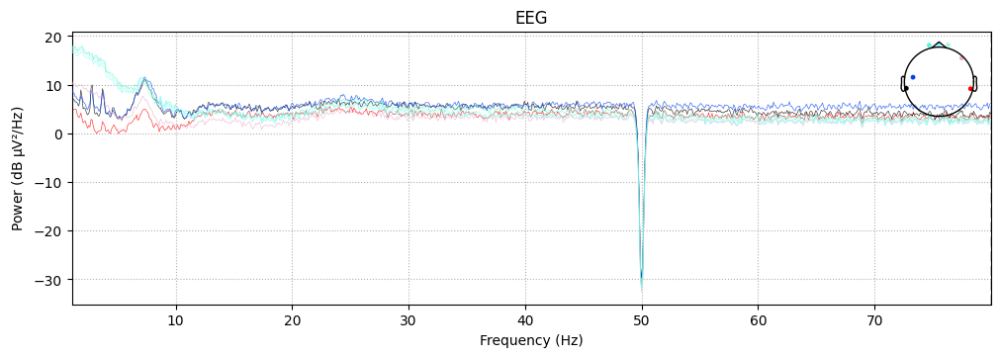

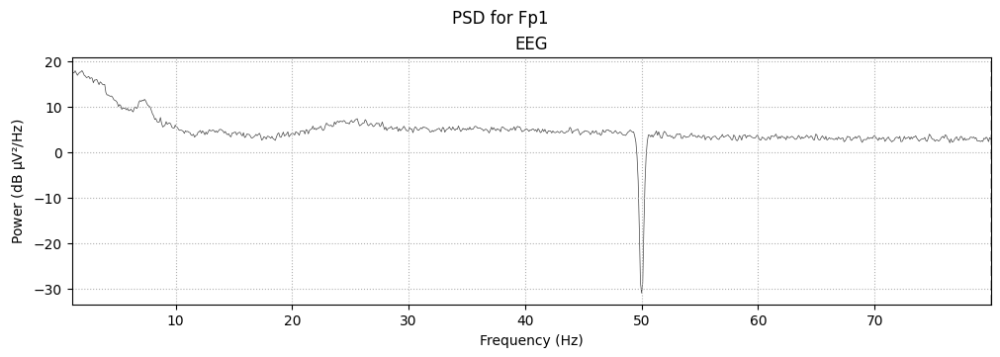

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Setting 43960 of 370408 (11.87%) samples to NaN, retaining 326448 (88.13%) samples.
Effective window size : 10.240 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


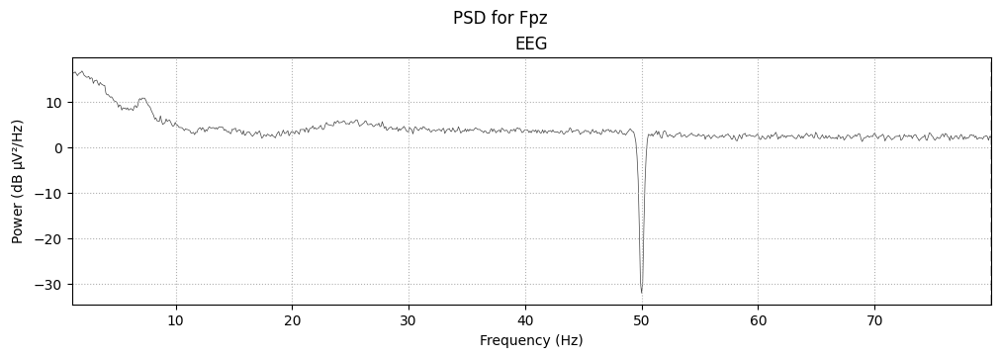

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Setting 43960 of 370408 (11.87%) samples to NaN, retaining 326448 (88.13%) samples.
Effective window size : 10.240 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


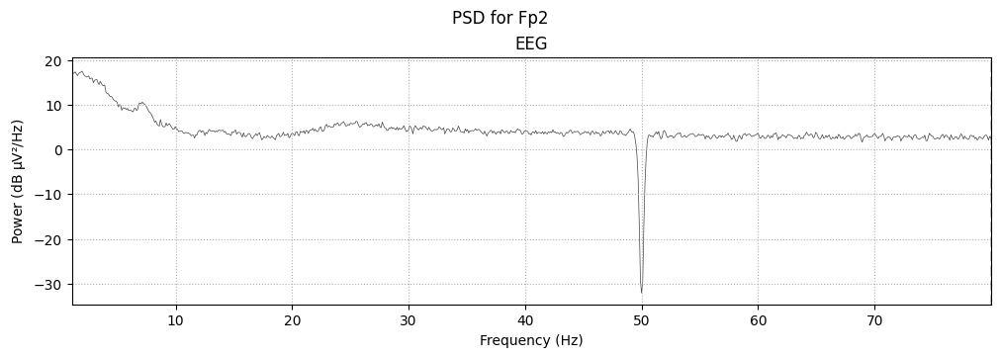

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Setting 43960 of 370408 (11.87%) samples to NaN, retaining 326448 (88.13%) samples.
Effective window size : 10.240 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


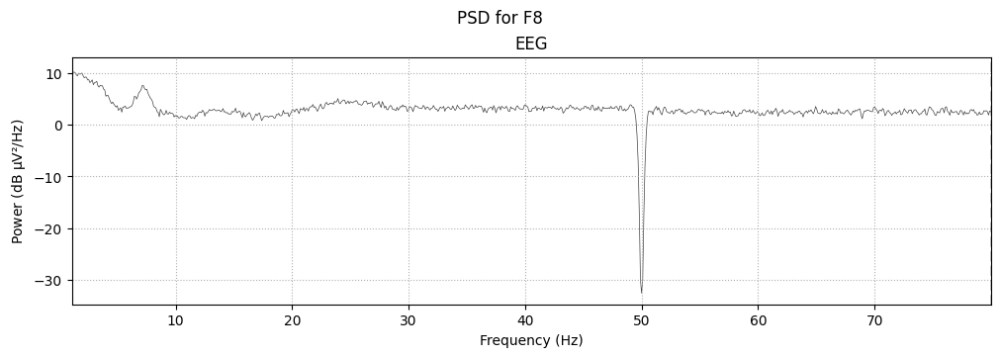

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Setting 43960 of 370408 (11.87%) samples to NaN, retaining 326448 (88.13%) samples.
Effective window size : 10.240 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


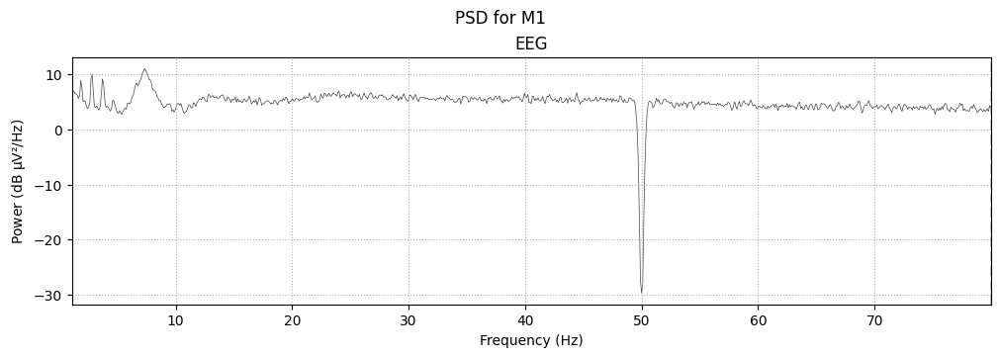

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Setting 43960 of 370408 (11.87%) samples to NaN, retaining 326448 (88.13%) samples.
Effective window size : 10.240 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


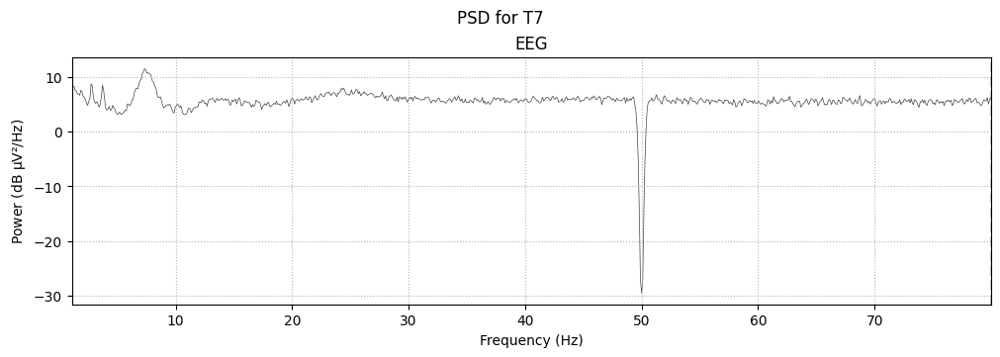

NOTE: plot_psd() is a legacy function. New code should use .compute_psd().plot().
Setting 43960 of 370408 (11.87%) samples to NaN, retaining 326448 (88.13%) samples.
Effective window size : 10.240 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.
Plotting power spectral density (dB=True).
Need more than one channel to make topography for eeg. Disabling interactivity.


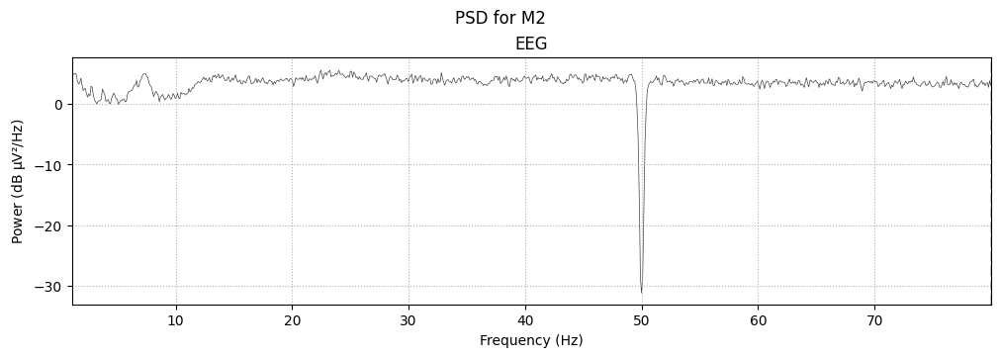

In [18]:
%matplotlib inline 

# picks can be either indices or names
picks = mne.pick_channels(bad_chan_identifier.ch_names, include=bad_channels)

# compute PSD of bad channels
bad_chan_identifier.plot_psd(
    fmin=1.0,
    fmax=80.0,
    picks=picks,
    dB=True,
    average=False,
)

for ch in bad_channels:
    # one figure per channel
    fig = bad_chan_identifier.plot_psd(
        fmin=1.0,
        fmax=80.0,
        picks=[ch],
        dB=True,
        average=False,
        show=False   
    )
    fig.suptitle(f'PSD for {ch}')
    plt.show()


#### Plot channel traces for visual inspection and select bad ones guided by metrics above and visual check here

In [19]:
%matplotlib qt

# Plot raw signal
bad_chan_identifier.plot(scalings="auto", block=True) # Cell block waits for plot to be closed before continuing (i.e., saving)

save_path = os.path.join(saving_path, "sub_data", f"{sub}", "data")
os.makedirs(save_path, exist_ok=True)  # Create the directory if it doesn't exist

file_p = join(save_path, f"{sub.replace(' ', '_')}_art_and_chan_removed_eeg.fif")
bad_chan_identifier.save(file_p, overwrite=True)

Channels marked as bad:
['T8', 'F8', 'M1', 'M2', 'T7']
Overwriting existing file.
Writing c:\Users\Juliette\Research\Projects\analysis_mSST\results\sub015 DBS OFF mSST\sub_data\sub015\data\sub015_art_and_chan_removed_eeg.fif
Closing c:\Users\Juliette\Research\Projects\analysis_mSST\results\sub015 DBS OFF mSST\sub_data\sub015\data\sub015_art_and_chan_removed_eeg.fif
[done]


#### After identifying noisy channels and bad segments, re-reference to average
It's important at this step that only channels that are EEG channels, have the EEG label! (see first step of script (after loading data))

In [20]:
 # ensure bad channels are listed here, otherwise they will be included in the average reference
bad_chan_identifier.info['bads']

['T8', 'F8', 'M1', 'M2', 'T7']

In [21]:
av_ref_data = []
av_ref_data = bad_chan_identifier.copy().set_eeg_reference(ref_channels="average")


EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


#### Plot PSD again

Setting 43960 of 370408 (11.87%) samples to NaN, retaining 326448 (88.13%) samples.
Effective window size : 10.240 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.
Plotting power spectral density (dB=True).


c:\Users\Juliette\anaconda3\envs\ephy\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


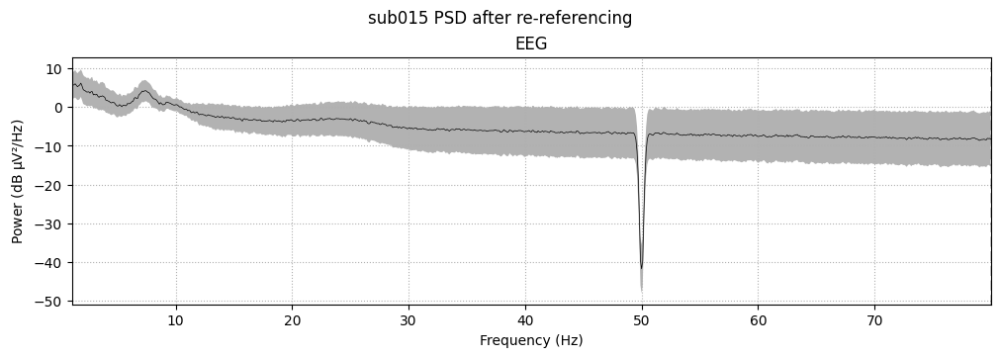

Setting 43960 of 370408 (11.87%) samples to NaN, retaining 326448 (88.13%) samples.
Effective window size : 10.240 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.
Plotting power spectral density (dB=True).


c:\Users\Juliette\anaconda3\envs\ephy\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


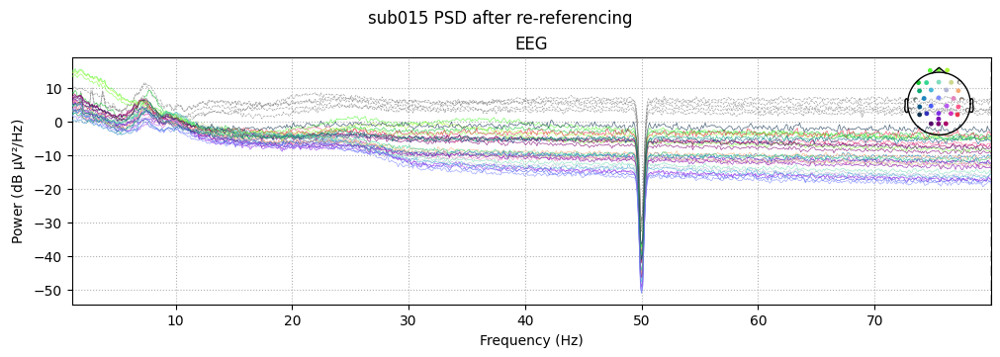

In [22]:
%matplotlib inline

### Plot PSD of signal (averaging all channels)
psd_final_avg = av_ref_data.compute_psd(method="welch", picks="eeg", fmin=1, fmax=80, window="hamming")
psd_final_avg.plot(dB=True, average=True).suptitle(f"{sub} PSD after re-referencing")
plt.show()

### Plot PSD of signal (not averaging)
psd_final = av_ref_data.compute_psd(method="welch", picks="eeg", fmin=1, fmax=80, window="hamming")
psd_final.plot(dB=True, average=False).suptitle(f"{sub} PSD after re-referencing")
sub_save_path = join(saving_path, "sub_data", f"{sub}", "figures", "PSDs")
plt.savefig(join(sub_save_path, f"{sub}_after_reRef.png"), dpi=300)
plt.show()

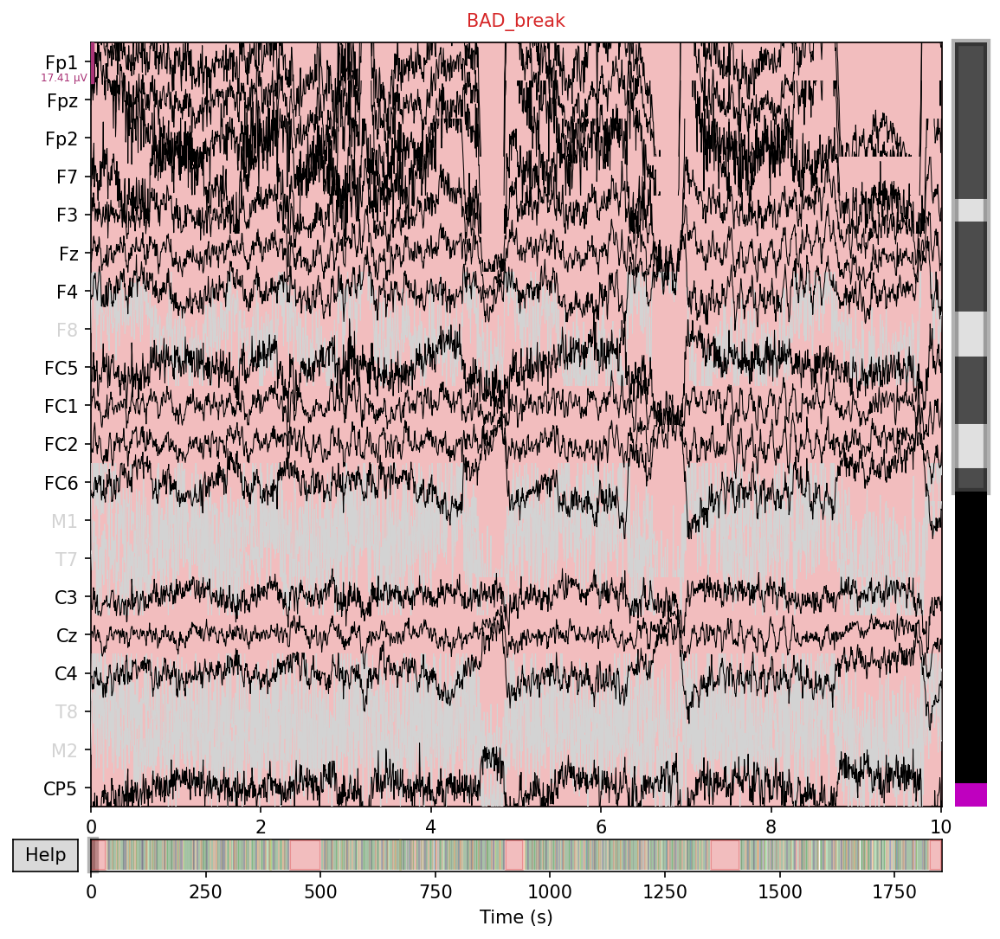

Channels marked as bad:
['T8', 'F8', 'M1', 'M2', 'T7']


In [23]:
%matplotlib qt
av_ref_data.plot(scalings="auto", title="After re-referencing to average")

In [ ]:
eog_evoked = create_eog_epochs(av_ref_data).average()
eog_evoked.apply_baseline(baseline=(None, -0.2))
eog_evoked.plot_joint()

In [ ]:
ecg_evoked = create_ecg_epochs(av_ref_data).average()
ecg_evoked.apply_baseline(baseline=(None, -0.2))
ecg_evoked.plot_joint()

### Independent Component Analysis
If ICA has already been fitted for this subject, it will be loaded.
If ICA hasn't been fitted, it will be.

Random note: when cognitive load increases, blinking usually decreases. Because when participants are expecting something important to happen (stimulus appearance), they will unconsciously try not to blink, to pay more attention (source: https://www.youtube.com/watch?v=AXCxrDikpaM)

In [25]:
# Dictionary to store the fitted or loaded ICA objects
ica_fit_dict = {}
 
# Construct the file path for the ICA file
ica_file_path = join(saving_path, 'sub_data', f"{sub}", f"{sub}-ica.fif")
    
# Check if the ICA file exists
if os.path.exists(ica_file_path):
    # If it exists, load the ICA object
    #ica = read_ica(ica_file_path)
    print(f"Loaded ICA for {sub} from {ica_file_path}")

else:
    # If it doesn't exist, fit ICA to the data
    ica = ICA(n_components=None, random_state=11, method='infomax') # Number of components is chosen by function to account for 99%
    ica.fit(av_ref_data.copy().pick_types(eeg=True, eog=True, ecg=True))                                  
   
    # Save the ICA object to file (saving the ICA decomposition, not any raw/cleaned data)
    ica.save(ica_file_path)
    print(f"Fitted and saved ICA for {sub} at {ica_file_path}")
    
ica_fit_dict = ica

NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
Fitting ICA to data using 27 channels (please be patient, this may take a while)
Omitting 43960 of 370408 (11.87%) samples, retaining 326448 (88.13%) samples.
Selecting by non-zero PCA components: 26 components
Computing Infomax ICA
Fitting ICA took 46.2s.
Writing ICA solution to c:\Users\Juliette\Research\Projects\analysis_mSST\results\sub015 DBS OFF mSST\sub_data\sub015\sub015-ica.fif...
Fitted and saved ICA for sub015 at c:\Users\Juliette\Research\Projects\analysis_mSST\results\sub015 DBS OFF mSST\sub_data\sub015\sub015-ica.fif


#### Components identified
By clicking on the components you will get more info about them (only in interactive mode (qt))

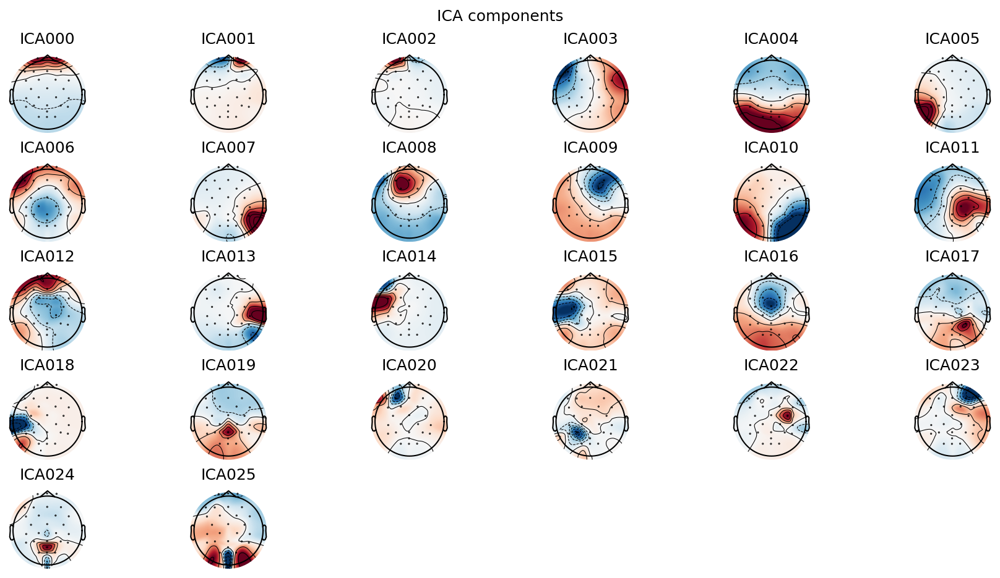

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
813 matching events found
No baseline correction applied
0 projection items activated


In [ ]:
%matplotlib qt

#%matplotlib inline

ica.plot_components(inst=av_ref_data,  psd_args={'fmin': 0, 'fmax': 80}, ncols=6, nrows=6) #Topographies of each component


Creating RawArray with float64 data, n_channels=28, n_times=370408
    Range : 0 ... 370407 =      0.000 ...  1852.035 secs
Ready.


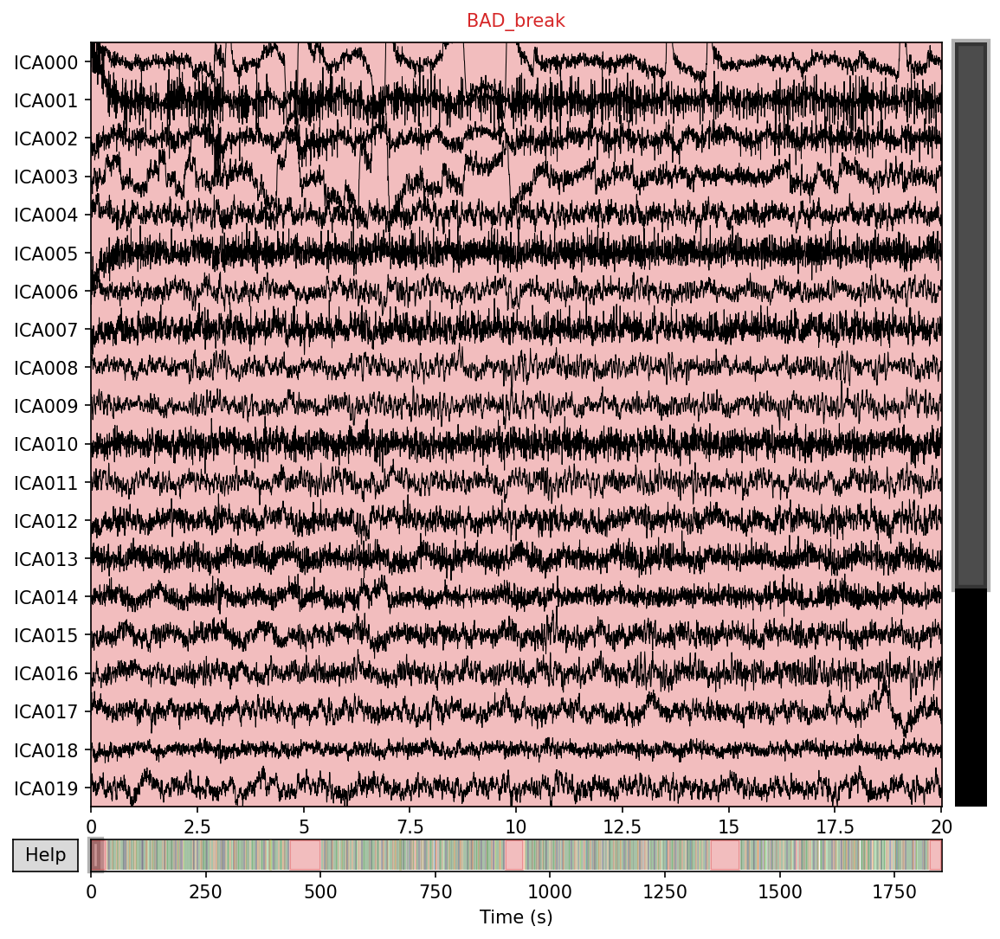

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
813 matching events found
No baseline correction applied
0 projection items activated
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
813 matching events found
No baseline correction applied
0 projection items activated
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
813 matching events found
No baseline correction applied
0 projection items activated
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
813 matching events found
No baseline correction applied
0 projection items activated
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
813 matching events found
No baseline correction applied
0 projection items activated
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
813 matching events found
No baseline correction applied
0 projection items ac

In [ ]:
%matplotlib qt
ica.plot_sources(av_ref_data) # Timeseries of each ICA component

In [ ]:
# Get the ICA time series for component 0 (ICA000)
ica_sources = ica.get_sources(av_ref_data)
ica_component = ica_sources.get_data(picks='ICA003')[0]

# Get the EOG channel data (assumed here to be 'BIP 03')
eog_data = av_ref_data.copy().pick(['BIP 03']).get_data()[0]

# Z-score both signals for fair comparison
# ica_component_z = (ica_component - np.mean(ica_component)) / np.std(ica_component)
# eog_data_z = (eog_data - np.mean(eog_data)) / np.std(eog_data)

scale_factor = np.std(eog_data) / np.std(ica_component)
ica_component_scaled = ica_component * scale_factor


# Time axis in seconds
times = av_ref_data.times

# Plotting
plt.figure(figsize=(12, 4))
plt.plot(times, ica_component_scaled, label='ICA003', alpha=0.7)
plt.plot(times, -eog_data, label='EOG Channel', alpha=0.7)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Comparison of ICA Component 3 and EOG Channel')
plt.legend()
plt.tight_layout()
plt.show()


    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
813 matching events found
No baseline correction applied
0 projection items activated
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
813 matching events found
No baseline correction applied
0 projection items activated
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
813 matching events found
No baseline correction applied
0 projection items activated
    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
813 matching events found
No baseline correction applied
0 projection items activated


In [ ]:
# blinks
ica.plot_overlay(av_ref_data, exclude=[0], picks="eeg")
# heartbeats
#

#### Percentage variance explained by all components together, and each individual component

In [44]:
explained_var_ratio = ica.get_explained_variance_ratio(av_ref_data)
for channel_type, ratio in explained_var_ratio.items():
    print(f"Fraction of {channel_type} variance explained by all components: {ratio}")

Fraction of eeg variance explained by all components: 1.0


#### Variance explained by each component
"ICA components are not orthogonal in sensor space, so their individual variances can overlap (and even be negative)" - from MNE docs
= the ratios add up to more than one. They have shared variances in the output I get here.

In [45]:
ch_types = ("eeg",)
var_explained = pd.DataFrame(columns=ch_types, index=pd.RangeIndex(ica.n_components_, name="Component"))

for component_idx in range(ica.n_components_):
    ratios = ica.get_explained_variance_ratio(
        av_ref_data,
        components=component_idx,
        ch_type="eeg"
    )
    
    var_explained.loc[component_idx, "eeg"] = ratios["eeg"]

var_explained


,eeg
Component,
0,0.689253
1,0.497225
2,0.447516
3,0.530473
4,0.513503
5,0.51855
6,0.510616
7,0.514888
8,0.504082


#### Automatic identification of ECG and EOG components

In [46]:
# Identifies which components are likely ECG and EOG (does not exclude them, just shows components!)
ecg_ind, ecg_scores = ica.find_bads_ecg(av_ref_data, ch_name="BIP 02")
eog_ind, eog_scores = ica.find_bads_eog(av_ref_data, ch_name="BIP 03")

print(f"ECG components identified: {ecg_ind}")
print(f"EOG components identified: {eog_ind}")

Using threshold: 0.36 for CTPS ECG detection
Using channel BIP 02 to identify heart beats.
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 8.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 7.75 Hz)
- Upper passband edge: 16.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 16.25 Hz)
- Filter length: 2000 samples (10.000 s)

Number of ECG events detected : 1519 (average pulse 55.837376856344655 / min.)
Not setting metadata
1519 matching events found
No baseline correction applied
Using data from preloaded Raw for 1519 events and 201 original time points ...
3 bad epochs dropped
Using EOG channel: BIP 03
Omitting 43960 of 370408 (11.87%) samples, retaining 326448 (88.13%) samples.
Omitting 43960 of 370408 (11.87%) samples, retaining 326448 (8

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  26 out of  26 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


ECG components identified: []
EOG components identified: [0]


In [47]:
# Plot (likely) ECG components
ica.plot_components(picks=ecg_ind)

ValueError: No appropriate components found for the given picks ([])

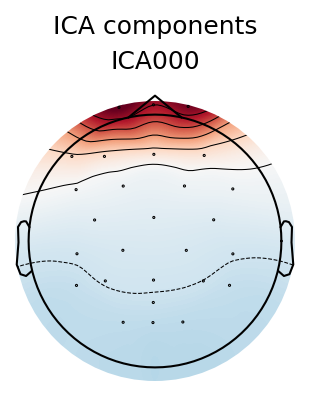

In [48]:
# Plot (likely) EOG components
ica.plot_components(picks=eog_ind)

#### Get visuals for EOG components identified 
Useful in deciding whether the component(s) are likely to reflect EOG activity or not.

    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
813 matching events found
No baseline correction applied
0 projection items activated
Creating RawArray with float64 data, n_channels=28, n_times=370408
    Range : 0 ... 370407 =      0.000 ...  1852.035 secs
Ready.
Using EOG channel: BIP 03
EOG channel index for this subject is: [33]
Omitting 43960 of 370408 (11.87%) samples, retaining 326448 (88.13%) samples.
Filtering the data to remove DC offset to help distinguish blinks from saccades
Selecting channel BIP 03 for blink detection
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff freque

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


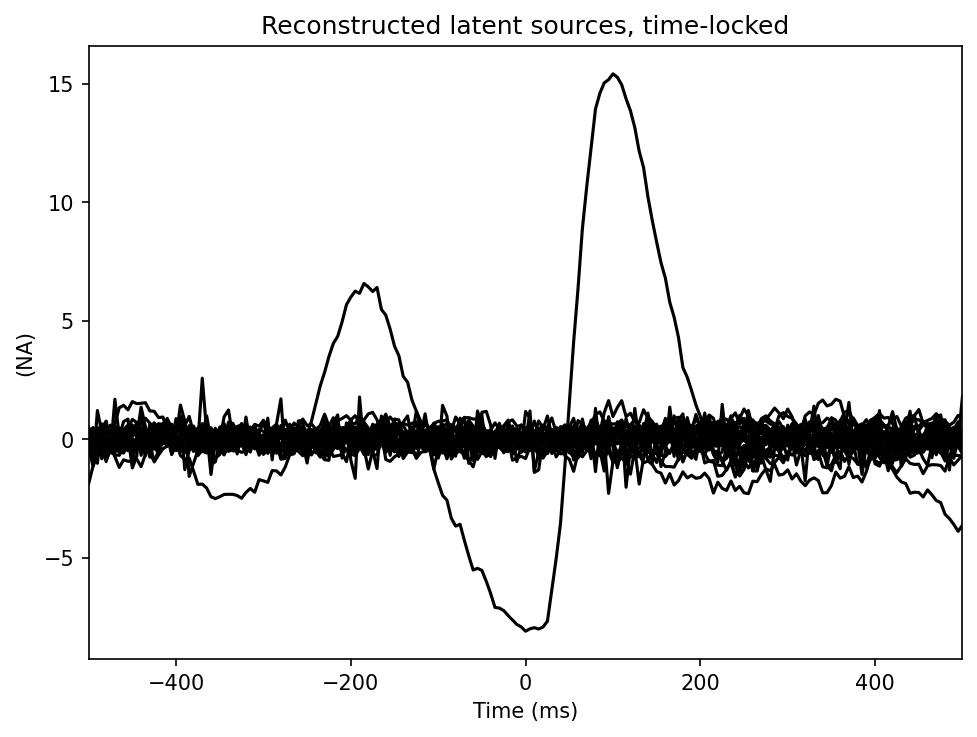

In [49]:
%matplotlib qt
#%matplotlib inline

# barplot of ICA component "EOG match" scores
ica.plot_scores(eog_scores)

# plot diagnostics
ica.plot_properties(av_ref_data, picks=eog_ind)

# plot ICs applied to raw data, with EOG matches highlighted
ica.plot_sources(av_ref_data, show_scrollbars=True)

# plot ICs applied to the averaged EOG epochs, with EOG matches highlighted
eog_evoked = create_eog_epochs(av_ref_data).average()
eog_evoked.apply_baseline(baseline=(None, -0.2))
eog_evoked.plot_joint()
ica.plot_sources(eog_evoked)
 

#### Get visuals for ECG components identified 
Useful in deciding whether the component(s) are likely to reflect ECG activity or not.

In [ ]:
%matplotlib qt
#%matplotlib inline

# barplot of ICA component "EOG match" scores
ica.plot_scores(ecg_scores)

# plot diagnostics
ica.plot_properties(av_ref_data, picks=ecg_ind)

# plot ICs applied to raw data, with EOG matches highlighted
ica.plot_sources(av_ref_data, show_scrollbars=True)

# plot ICs applied to the averaged EOG epochs, with EOG matches highlighted
ecg_evoked = create_ecg_epochs(av_ref_data).average()
ecg_evoked.apply_baseline(baseline=(None, -0.2))
ecg_evoked.plot_joint()
ica.plot_sources(ecg_evoked)
 

#### Automatic detection of muscle artefacts

In [50]:
muscle_idx_auto, scores = ica.find_bads_muscle(av_ref_data)
ica.plot_scores(scores, exclude=muscle_idx_auto)
print(
    f"Automatically found muscle artifact ICA components: {muscle_idx_auto}"
)

Setting 43960 of 370408 (11.87%) samples to NaN, retaining 326448 (88.13%) samples.
Effective window size : 10.240 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.
Automatically found muscle artifact ICA components: [0, 1, 2, 3, 4, 5, 7, 10, 13, 14, 15, 18, 20, 23, 25]


#### Which components would we want to exclude (manual exclusion)?
We can use the automatic identification of EOG and ECG from step above as information, but we don't have to choose all of the identified components above if we have reason to believe they're not all correctly identified

In [51]:
to_exclude = [0, 3, 5, 7] # saving this in variable for easier input below

#### What would the signal look like if removing components based on EOG and ECG channels, by manual selection, and both

- Red = before removing components
- Black = after removing components

Applying ICA to Raw instance
    Transforming to ICA space (26 components)
    Zeroing out 1 ICA component
    Projecting back using 27 PCA components


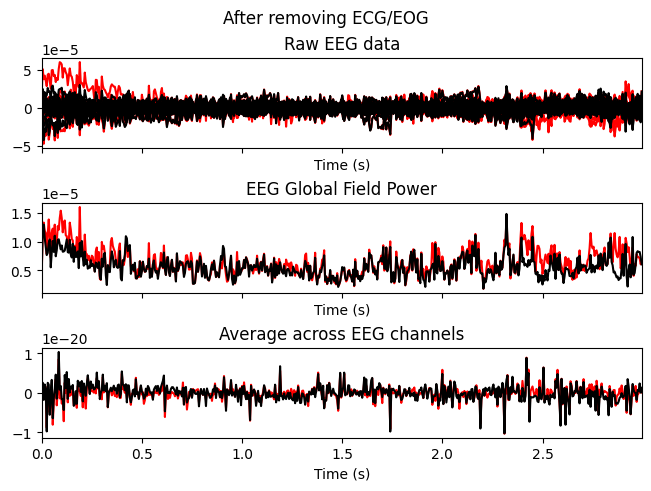

Applying ICA to Raw instance
    Transforming to ICA space (26 components)
    Zeroing out 15 ICA components
    Projecting back using 27 PCA components


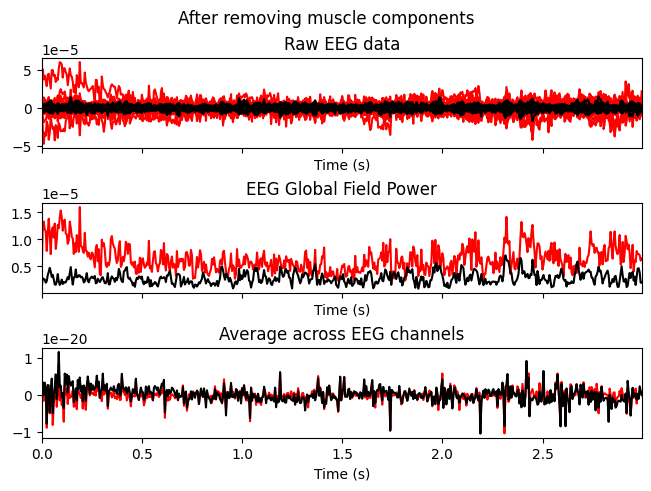

Applying ICA to Raw instance
    Transforming to ICA space (26 components)
    Zeroing out 4 ICA components
    Projecting back using 27 PCA components


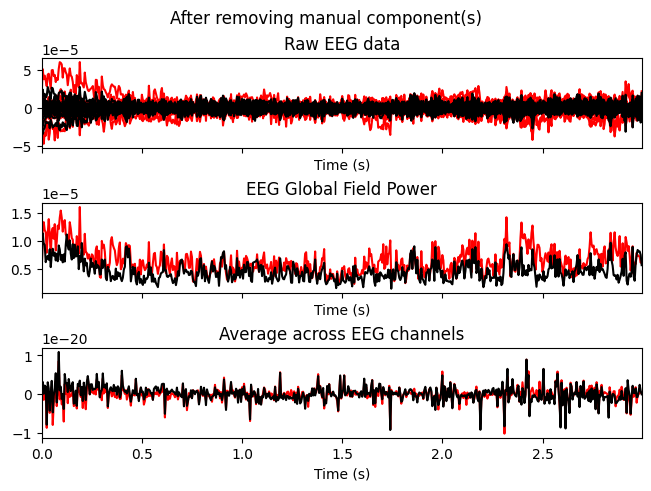

Applying ICA to Raw instance
    Transforming to ICA space (26 components)
    Zeroing out 15 ICA components
    Projecting back using 27 PCA components


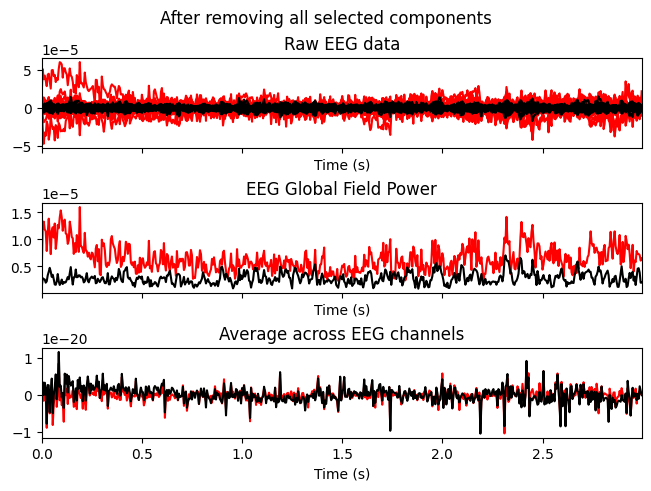

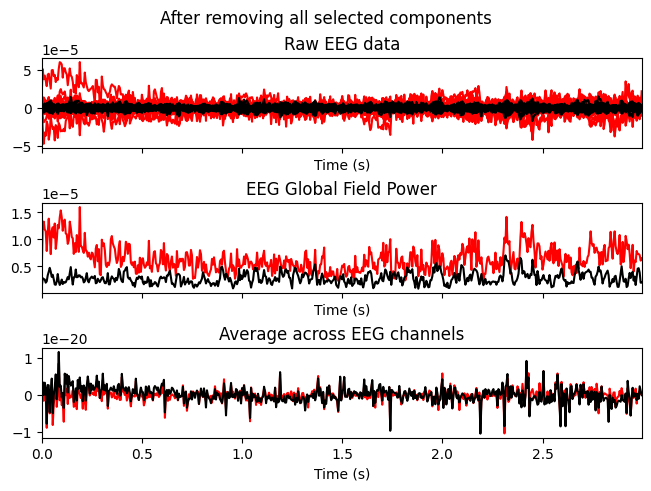

In [52]:
%matplotlib inline

# Preview after removing ECG + EOG components only
ica.plot_overlay(av_ref_data, exclude=ecg_ind + eog_ind, title='After removing ECG/EOG')

# Preview after removing muscle components only
ica.plot_overlay(av_ref_data, exclude=muscle_idx_auto, title='After removing muscle components')

# Preview after removing manual components only (input which component index you want to remove to preview)
ica.plot_overlay(av_ref_data, exclude=to_exclude, title='After removing manual component(s)')

# Preview after removing both ECG/EOG + muscle_idx_auto + manual components
ica.plot_overlay(av_ref_data, exclude=to_exclude + ecg_ind + eog_ind + muscle_idx_auto, title='After removing all selected components')


### Exclude components + apply ICA
Two ways to explude:
- Manually: Choosing which components ourselves, is the variable created 2 cells above (would recommend this)
- Automatically: Components that were identified as likely to be ECG and EOG are excluded (wouldn't always trust this? Not sure about the ECG detection, and it doesn't always recognise lateral eyemovement artefacts)

In [53]:
ica.exclude = to_exclude # exclude components manually by adding component number here

#ica.exclude.extend(ecg_ind + eog_ind) # exclude automatically using the ECG and EOG channels, can also add muscle_idx_auto here if you want to exclude those as well


In [54]:
# Apply ICA to the data
data_after_ica = ica.apply(av_ref_data)

Applying ICA to Raw instance
    Transforming to ICA space (26 components)
    Zeroing out 4 ICA components
    Projecting back using 27 PCA components


In [55]:
ica # here we can check that the correct components have been excluded, gives us ica info

Method,infomax
Fit parameters,extended=Falsemax_iter=500
Fit,500 iterations on raw data (326448 samples)
ICA components,26
Available PCA components,27
Channel types,eeg
ICA components marked for exclusion,ICA000ICA003ICA005ICA007


#### Save file after ICA

In [56]:
save_path = os.path.join(saving_path, "sub_data", f"{sub}", "data")
os.makedirs(save_path, exist_ok=True)  # Create the directory if it doesn't exist

file_p = join(save_path, f"{sub.replace(' ', '_')}_postICA_EEGdata_eeg.fif")
data_after_ica.save(file_p, overwrite=True)

Writing c:\Users\Juliette\Research\Projects\analysis_mSST\results\sub015 DBS OFF mSST\sub_data\sub015\data\sub015_postICA_EEGdata_eeg.fif
Closing c:\Users\Juliette\Research\Projects\analysis_mSST\results\sub015 DBS OFF mSST\sub_data\sub015\data\sub015_postICA_EEGdata_eeg.fif
[done]


#### If saved previously, load it:


In [ ]:
temp_sub = sub.replace(' ', '_')
filename = join(saving_path, "sub_data", sub, "data", f"{temp_sub}_postICA_EEGdata_eeg.fif")

data_after_ica = mne.io.read_raw(filename, preload=True)

### Plot PSD after ICA

Setting 43960 of 370408 (11.87%) samples to NaN, retaining 326448 (88.13%) samples.
Effective window size : 10.240 (s)
At least one good data span is shorter than n_per_seg, and will be analyzed with a shorter window than the rest of the file.
Plotting power spectral density (dB=True).


c:\Users\Juliette\anaconda3\envs\ephy\lib\site-packages\mne\viz\utils.py:158: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  (fig or plt).show(**kwargs)


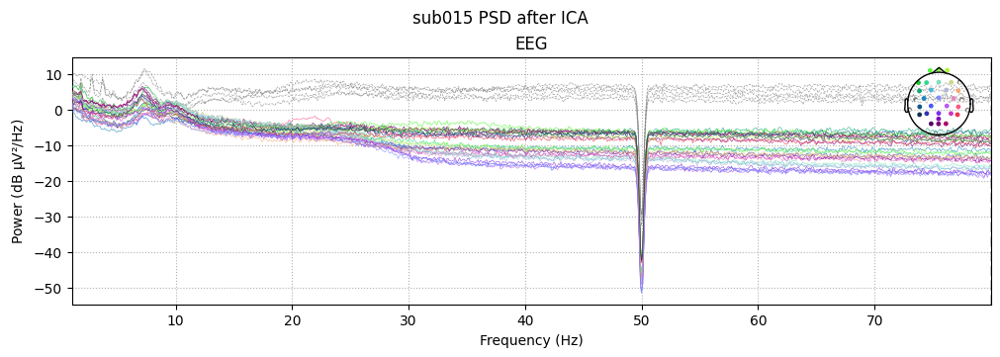

In [57]:
%matplotlib inline

### Plot PSD of signal (not averaging)
psd_after_ica = data_after_ica.compute_psd(method="welch", picks="eeg", fmin=1, fmax=80, window="hamming")
psd_after_ica.plot(dB=True, average=False).suptitle(f"{sub} PSD after ICA")
sub_save_path = join(saving_path, "sub_data", f"{sub}", "figures", "PSDs")
plt.savefig(join(sub_save_path, f"{sub}_after_ICA_PSD.png"), dpi=300)
plt.show()

### Visual inspection of data after preprocessing and filtering
ECG or EOG artefacts still present?

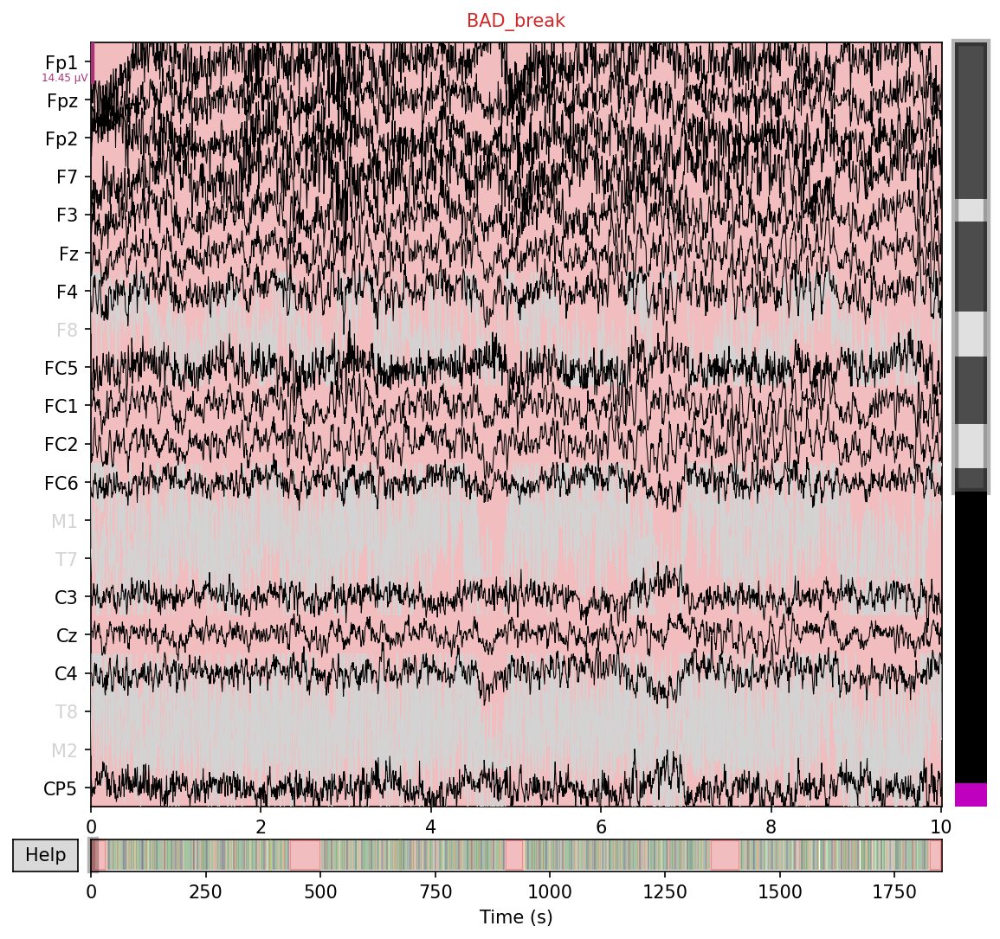

Channels marked as bad:
['T8', 'F8', 'M1', 'M2', 'T7']


In [58]:
%matplotlib qt

data_after_ica.plot(scalings="auto")

## Extract epochs for visual artefact rejection

In [59]:
events, event_dict = mne.events_from_annotations(data_after_ica)
# List of keys to keep
keys_to_keep = ['GC', 'GF', 'GO', 'GS', 'continue', 'stop']

# Create the new dictionary by filtering the original one
filtered_event_dict = {key: event_dict[key] for key in keys_to_keep}

print(filtered_event_dict)
# Get the event codes (values) from the filtered dictionary
valid_event_codes = list(filtered_event_dict.values())

# Filter the events array where the event code is in the valid_event_codes list
filtered_events = np.array([event for event in events if event[2] in valid_event_codes])

print(filtered_events)
#picks = [raw.ch_names[0], raw.ch_names[1]]
tmin = -0.5
tmax = 1.5
epochs = mne.Epochs(data_after_ica, filtered_events, event_id=filtered_event_dict, tmin=tmin, tmax=tmax, baseline=(None, 0), preload=True)
metadata = pd.DataFrame({'subject':[sub] * len(epochs)})
epochs.metadata = metadata

Used Annotations descriptions: ['GC', 'GF', 'GO', 'GS', 'continue', 'late', 'resp', 'stop']
{'GC': 1, 'GF': 2, 'GO': 3, 'GS': 4, 'continue': 5, 'stop': 8}
[[  7184      0      4]
 [  7211      0      8]
 [  7948      0      1]
 ...
 [363213      0      5]
 [363897      0      3]
 [364533      0      2]]
Not setting metadata
639 matching events found
Setting baseline interval to [-0.5, 0.0] s
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 639 events and 401 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns


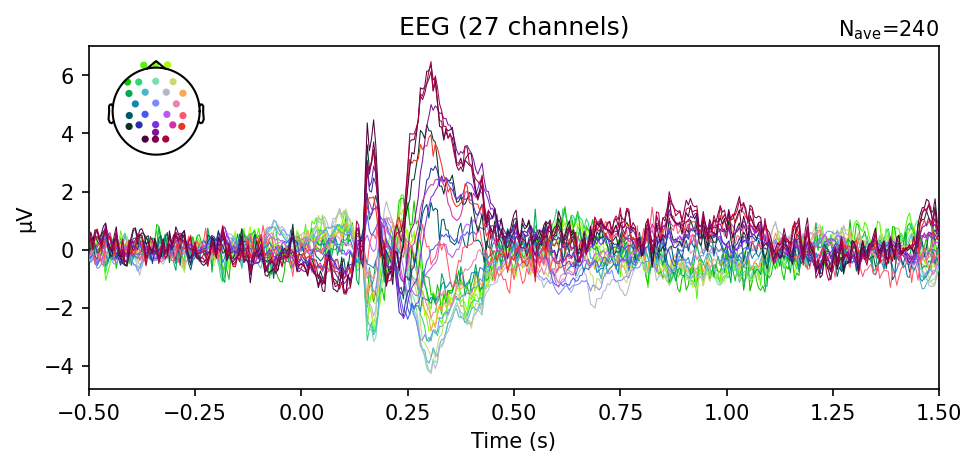

In [60]:
epochs['GO'].average().plot()

In [61]:
# Generate list of evoked objects from conditions names
evokeds = [epochs[name].average() for name in ("GO", "GF","GC", "GS")]

In [110]:
%matplotlib qt
colors = "blue", "red", "green", "black"
title = "Evoked responses"

fig, axes = plt.subplots(1)

mne.viz.plot_evoked_topo(evokeds, title=title, background_color="w", axes=axes)

fig.savefig(join(saving_path, 'evoked_responses.pdf'))

list index out of range


Traceback (most recent call last):
  File "c:\Users\Juliette\anaconda3\envs\ephy\lib\site-packages\matplotlib\cbook.py", line 298, in process
    func(*args, **kwargs)
  File "c:\Users\Juliette\anaconda3\envs\ephy\lib\site-packages\mne\viz\topo.py", line 373, in _plot_topo_onpick
    show_func(ax, ch_idx)
  File "c:\Users\Juliette\anaconda3\envs\ephy\lib\site-packages\mne\viz\topo.py", line 617, in _plot_timeseries
    ax.set_ylabel(y_label[ch_idx])
IndexError: list index out of range


In [ ]:
data = io.load_behav_data([session_id], onedrive_path)

stats = {}
stats = utils.extract_stats(data)

sub015 DBS OFF mSST


In [78]:
import functions.preprocessing as preprocessing
from collections import defaultdict

In [79]:
# Prepare variables and dictionaries for storing results
# Dictionary to store subject epochs in
sub_dict_epochs_subsets = {}  #  Stores the epochs for each condition and for each subject/session
sub_dict_lm_GO = {}  #  Stores the epochs for lm_GO trials for each subject/session
sub_dict_RT = {}  #  Stores the mean reaction time for each trial type
sub_dict_stats = {}  #  Stores behavioral stats for each subject/session

cluster_results_dict = {}
cluster_results_dict = defaultdict(dict)  # Each missing key gets an empty dictionary


In [81]:
session_dict = {}
sub = session_id[:6]
subject_ID = session_id.split(' ') [0]
condition = session_id.split(' ') [1] + ' ' + session_id.split(' ') [2]
sub_onedrive_path = join(onedrive_path, subject_ID)
sub_onedrive_path_task = join(onedrive_path, subject_ID, 'synced_data', session_id)
# filename = [f for f in os.listdir(sub_onedrive_path_task) if (
#     f.endswith('.set') and f.startswith('SYNCHRONIZED_INTRACRANIAL'))]

# if not filename:
#     raise FileNotFoundError(f"No .set file found in {sub_onedrive_path_task}")

# file = join(sub_onedrive_path_task, filename[0])

# if not os.path.isfile(file):
#     raise FileNotFoundError(f"File does not exist: {file}")

# print(f"Loading file: {file}")
# #file = join(sub_onedrive_path_task, filename[0])
# raw = read_raw(file, preload=True)

saving_path_single = join(results_path, 'single_sub', f'{sub} mSST','eeg') 
os.makedirs(saving_path_single, exist_ok=True)  # Create the directory if it doesn't exist

# ephy_plotting.plot_raw_stim(session_ID, raw, saving_path_single)
# psd_left, freqs_left, psd_right, freqs_right = analysis.compute_psd_welch(raw)
# session_dict['psd_left'] = psd_left
# session_dict['freqs_left'] = freqs_left
# session_dict['psd_right'] = psd_right
# session_dict['freqs_right'] = freqs_right
# ephy_plotting.plot_psd_log(
#     session_ID, raw, freqs_left, psd_left, 
#     freqs_right, psd_right, saving_path_single, is_filt=False
#     )
# ephy_plotting.plot_stft_stim(
#     session_ID, raw, saving_path=saving_path_single, is_filt=False, 
#     vmin = -3, vmax = 1, fmin=0, fmax=100
#     )

# session_dict['CHANNELS'] = raw.ch_names

# # Rename channels to be consistent across subjects:
# new_channel_names = [
#     "Left_STN",
#     "Right_STN",
#     "left_peak_STN",
#     "right_peak_STN",
#     "STIM_Left_STN",
#     "STIM_Right_STN"
# ]

# # Get the existing channel names
# old_channel_names = raw.ch_names

# # Create a mapping from old to new names
# rename_dict = {old: new for old, new in zip(old_channel_names, new_channel_names)}

# # Rename the channels
# raw.rename_channels(rename_dict)

# session_dict['RENAMED_CHANNELS'] = raw.ch_names

# # Filter between 1 and 50 Hz:
# filtered_data = raw.copy().filter(l_freq=1, h_freq=50)
#filtered_data_resampled = filtered_data.copy().resample(sfreq=200) # DO NOT WORK WITH NaNs
# DOWNSAMPLED DATA SHOULD NOT BE EPOCHED BECAUSE IT INTRODUCES JITTER IN THE EVENTS

# Extract events and create epochs
# only keep lfp channels
#filtered_data_lfp = filtered_data.copy().pick_channels([filtered_data.ch_names[0], filtered_data.ch_names[1]])

epochs, filtered_event_dict = preprocessing.create_epochs(data_after_ica, session_id)

mSST_raw_behav_session_data_path = join(
        onedrive_path, subject_ID, "raw_data", 'BEHAVIOR', condition, 'mSST'
        )
for filename in os.listdir(mSST_raw_behav_session_data_path):
        if filename.endswith(".csv"):
            fname = filename
filepath_behav = join(mSST_raw_behav_session_data_path, fname)
df = pd.read_csv(filepath_behav)

# return the index of the first row which is not filled by a Nan value:
start_task_index = df['blocks.thisRepN'].first_valid_index()
# Crop dataframe in 2 parts: before and after the task:
#df_training = df.iloc[:start_task_index]
df_maintask = df.iloc[start_task_index:-1]

# remove the trials with early presses, as in these trials the cues were not presented
early_presses = df_maintask[df_maintask['early_press_resp.corr'] == 1]
early_presses_trials = list(early_presses.index)
number_early_presses = len(early_presses_trials)

# remove trials with early presses from the dataframe:
df_maintask_copy = df_maintask.drop(early_presses_trials)

# Filter successful and unsuccessful trials:
(epochs_subsets, epochs_lm, mean_RT_dict) = preprocessing.create_epochs_subsets_from_behav(
        df_maintask_copy, 
        epochs, 
        filtered_event_dict
        )

sub_dict_epochs_subsets[session_id] = epochs_subsets
sub_dict_lm_GO[session_id] = epochs_lm
sub_dict_RT[session_id] = mean_RT_dict
sub_dict_stats[session_id] = stats[session_id]



Used Annotations descriptions: ['GC', 'GF', 'GO', 'GS', 'continue', 'late', 'resp', 'stop']
Not setting metadata
639 matching events found


No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 639 events and 1401 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
dict_keys(['GO_successful', 'GO_unsuccessful', 'GS_successful', 'GS_unsuccessful', 'GF_successful', 'GF_unsuccessful', 'GC_successful', 'GC_unsuccessful', 'STOP_successful', 'STOP_unsuccessful', 'CONTINUE_successful', 'CONTINUE_unsuccessful'])


In [82]:
######################
### TFR PARAMETERS ###
######################

decim = 1 
freqs = np.arange(1, 40, 1) 
# For 500ms time resolution at 1 Hz: n_cycles = 1 * 0.5 = 0.5
# For 50ms time resolution at 40 Hz: n_cycles = 40 * 0.05 = 2
# Linear interpolation between these points
#n_cycles = 0.5 + (freqs - 1) * (2 - 0.5) / (40 - 1)
#n_cycles = freqs / 2.0
n_cycles = np.minimum(np.maximum(freqs / 2.0, 2), 10)

tfr_args = dict(
    method="morlet",
    freqs=freqs,
    n_cycles=n_cycles,
    decim=decim,
    return_itc=False,
    average=False
)        

tmin_tmax = [-500, 1500]
vmin_vmax = [-70, 70]

In [76]:
import functions.ephy_plotting as ephy_plotting

In [83]:
single_sub_dict_subsets = {key: value for key, value in sub_dict_epochs_subsets.items() if sub in key}
print(single_sub_dict_subsets.keys())
single_sub_dict_lm_GO = {key: value for key, value in sub_dict_lm_GO.items() if sub in key}
single_sub_RT_dict = {key: value for key, value in sub_dict_RT.items() if sub in key}
single_sub_stats_dict = {key: value for key, value in sub_dict_stats.items() if sub in key}
saving_path_single = join(results_path, 'single_sub', f'{sub} mSST','lfp_perc_sig_change', 'beta_only')
os.makedirs(saving_path_single, exist_ok=True)  # Create the directory if it doesn't exist


dict_keys(['sub015 DBS OFF mSST'])


In [89]:
epochs_subsets

<Epochs | 639 events (all good), -3.5 – 3.5 s (baseline off), ~232.3 MB, data loaded, with metadata,
 'GC': 0
 'GF': 0
 'GO': 0
 'GS': 0
 'continue': 0
 'stop': 0
 'GO_successful': 215
 'GO_unsuccessful': 25
 'GC_successful': 79
 'GC_unsuccessful': 1
 and 9 more events ...>

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.3s finished


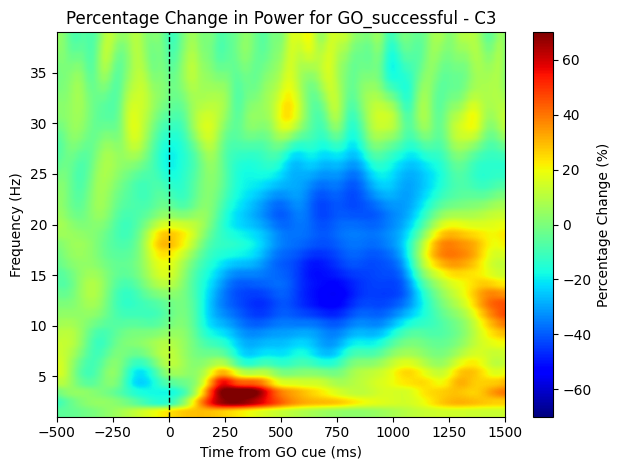

In [115]:
%matplotlib inline
epoch_cond = 'GO_successful'
t_min_max = [-500, 1500]
data = epochs_subsets[epoch_cond]
C4_epochs = data.copy().pick(["C3"])
power_c4 = C4_epochs.compute_tfr(**tfr_args)
mean_power_c4 = np.nanmean(power_c4.data, axis=0).squeeze()

times = power_c4.times * 1000  # Convert to milliseconds
freqs = power_c4.freqs

baseline_indices = (times >= -500) & (times <= -200)
baseline_power_c4 = np.nanmean(mean_power_c4[:, baseline_indices], axis=1, keepdims=True)
percentage_change_c4 = (mean_power_c4 - baseline_power_c4) / baseline_power_c4 * 100

time_indices = np.logical_and(times >= t_min_max[0], times <= t_min_max[1])
sliced_data = percentage_change_c4[:, time_indices].squeeze()    

plt.imshow(sliced_data, aspect='auto', origin='lower', 
        extent=[t_min_max[0], t_min_max[1], 
        tfr_args["freqs"][0], tfr_args["freqs"][-1]], 
        cmap='jet', vmin=vmin_vmax[0], vmax=vmin_vmax[-1]
)
plt.axvline(x=0, color='k', linestyle='--', linewidth=1)
plt.title(f"Percentage Change in Power for {epoch_cond} - C3")
plt.xlabel("Time from GO cue (ms)")
plt.ylabel("Frequency (Hz)")
plt.colorbar(label="Percentage Change (%)")
plt.tight_layout()

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


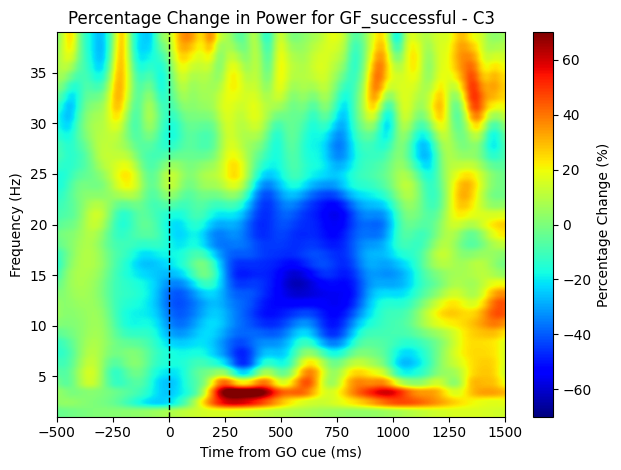

In [116]:
epoch_cond = 'GF_successful'
t_min_max = [-500, 1500]
data = epochs_subsets[epoch_cond]
C4_epochs = data.copy().pick(["C3"])
power_c4 = C4_epochs.compute_tfr(**tfr_args)
mean_power_c4 = np.nanmean(power_c4.data, axis=0).squeeze()

times = power_c4.times * 1000  # Convert to milliseconds
freqs = power_c4.freqs

baseline_indices = (times >= -500) & (times <= -200)
baseline_power_c4 = np.nanmean(mean_power_c4[:, baseline_indices], axis=1, keepdims=True)
percentage_change_c4 = (mean_power_c4 - baseline_power_c4) / baseline_power_c4 * 100

time_indices = np.logical_and(times >= t_min_max[0], times <= t_min_max[1])
sliced_data = percentage_change_c4[:, time_indices].squeeze()    

plt.imshow(sliced_data, aspect='auto', origin='lower', 
        extent=[t_min_max[0], t_min_max[1], 
        tfr_args["freqs"][0], tfr_args["freqs"][-1]], 
        cmap='jet', vmin=vmin_vmax[0], vmax=vmin_vmax[-1]
)
plt.axvline(x=0, color='k', linestyle='--', linewidth=1)
plt.title(f"Percentage Change in Power for {epoch_cond} - C3")
plt.xlabel("Time from GO cue (ms)")
plt.ylabel("Frequency (Hz)")
plt.colorbar(label="Percentage Change (%)")
plt.tight_layout()

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


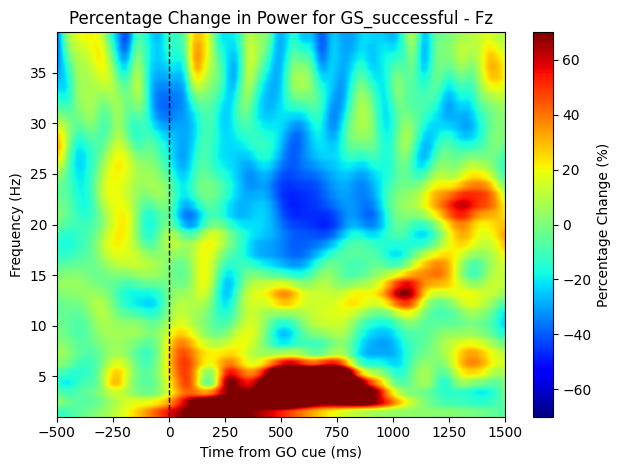

In [118]:
epoch_cond = 'GS_successful'
t_min_max = [-500, 1500]
data = epochs_subsets[epoch_cond]
fz_epochs = data.copy().pick(["Fz"])
power_fz = fz_epochs.compute_tfr(**tfr_args)
mean_power_fz = np.nanmean(power_fz.data, axis=0).squeeze()

times = power_fz.times * 1000  # Convert to milliseconds
freqs = power_fz.freqs

baseline_indices = (times >= -500) & (times <= -200)
baseline_power_fz = np.nanmean(mean_power_fz[:, baseline_indices], axis=1, keepdims=True)
percentage_change_fz = (mean_power_fz - baseline_power_fz) / baseline_power_fz * 100

time_indices = np.logical_and(times >= t_min_max[0], times <= t_min_max[1])
sliced_data_fz = percentage_change_fz[:, time_indices].squeeze()    

plt.imshow(sliced_data_fz, aspect='auto', origin='lower', 
        extent=[t_min_max[0], t_min_max[1], 
        tfr_args["freqs"][0], tfr_args["freqs"][-1]], 
        cmap='jet', vmin=vmin_vmax[0], vmax=vmin_vmax[-1]
)
plt.axvline(x=0, color='k', linestyle='--', linewidth=1)
plt.title(f"Percentage Change in Power for {epoch_cond} - Fz")
plt.xlabel("Time from GO cue (ms)")
plt.ylabel("Frequency (Hz)")
plt.colorbar(label="Percentage Change (%)")
plt.tight_layout()

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


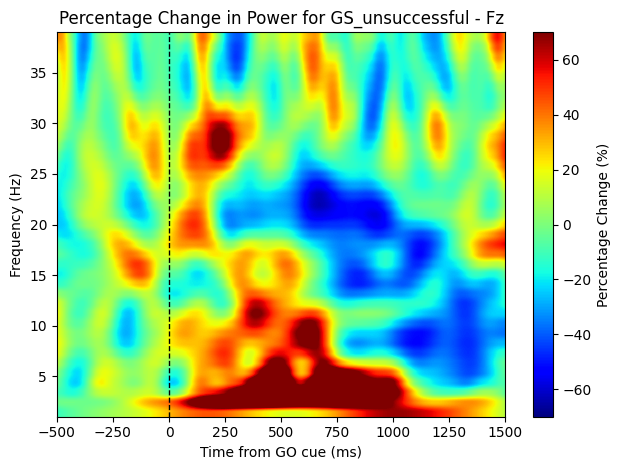

In [119]:
epoch_cond = 'GS_unsuccessful'
t_min_max = [-500, 1500]
data = epochs_subsets[epoch_cond]
fz_epochs = data.copy().pick(["Fz"])
power_fz = fz_epochs.compute_tfr(**tfr_args)
mean_power_fz = np.nanmean(power_fz.data, axis=0).squeeze()

times = power_fz.times * 1000  # Convert to milliseconds
freqs = power_fz.freqs

baseline_indices = (times >= -500) & (times <= -200)
baseline_power_fz = np.nanmean(mean_power_fz[:, baseline_indices], axis=1, keepdims=True)
percentage_change_fz = (mean_power_fz - baseline_power_fz) / baseline_power_fz * 100

time_indices = np.logical_and(times >= t_min_max[0], times <= t_min_max[1])
sliced_data_fz = percentage_change_fz[:, time_indices].squeeze()    

plt.imshow(sliced_data_fz, aspect='auto', origin='lower', 
        extent=[t_min_max[0], t_min_max[1], 
        tfr_args["freqs"][0], tfr_args["freqs"][-1]], 
        cmap='jet', vmin=vmin_vmax[0], vmax=vmin_vmax[-1]
)
plt.axvline(x=0, color='k', linestyle='--', linewidth=1)
plt.title(f"Percentage Change in Power for {epoch_cond} - Fz")
plt.xlabel("Time from GO cue (ms)")
plt.ylabel("Frequency (Hz)")
plt.colorbar(label="Percentage Change (%)")
plt.tight_layout()

Here I use MID epochs. I included it in the preprocessing step for now at least, just to "fully" clean files and then testing some basic analyses in another script (eeg_TFR_cue.ipynb)

In [ ]:
def EEG_get_cue_epochs(data, tmin, tmax):    
    """
    Extracts all three cue conditions (reward, loss, neutral).
    
    Input:
    - raw: raw eeg file

    Returns:
    - cue_epochs: epoch object containing the three cue condition epochs. 
    - reward_cue: np.array of reward cue
    - loss_cue: np.array of loss cue
    - neutral_cue: np.array of neutral cue
    - filtered_event_dict_cue: dictionairy containing string of condition names
    """

    
    events, event_dict = mne.events_from_annotations(data)
    # List of keys to keep
    keys_to_keep = ['Win_cue', "Loss_cue", 'Neutral_cue']
    # Create the new dictionary by filtering the original one
    filtered_event_dict = {key: event_dict[key] for key in keys_to_keep}

    print(filtered_event_dict)

    # Get the event codes (values) from the filtered dictionary
    valid_event_codes = list(filtered_event_dict.values())

    # Filter the events array where the event code is in the valid_event_codes list
    filtered_events = np.array([event for event in events if event[2] in valid_event_codes])

    cue_epochs = mne.Epochs(data, filtered_events, event_id=filtered_event_dict, tmin=tmin, tmax=tmax, baseline=(None), preload=True, reject_by_annotation=False)

    print(f"Total epochs: {len(filtered_events)}")
    print(f"Good epochs: {len(cue_epochs)}")

    return cue_epochs, filtered_event_dict

In [ ]:
# Dictionary to store subject epochs in
sub_dict_cue = {}

tmin, tmax = [-3, 3.0]

##################
### CUE EPOCHS ###
##################

cue_epochs, cue_event_dict = EEG_get_cue_epochs(data_after_ica, tmin, tmax)

sub_dict_cue[sub] = cue_epochs
sub_dict_cue

#### Go through epochs and save bad epochs

#### Cue epochs

#### NOTE: Here I have kept ALL epochs, even if they have previously been marked as bad (e.g.,movement), and I will have to remove these again now. 

In [ ]:
%matplotlib qt

proc_ep_path = "C:\\Users\\chst14\\OneDrive - Charité - Universitätsmedizin Berlin\\phd_charite\\WP3\\eeg_output\\"

sub_ep_path = os.path.join(proc_ep_path, "sub_data", f"{sub}", f"{sub.replace(' ', '_')}_processed_cue_epochs-epo.fif")

already_processed_cue = False

if os.path.exists(sub_ep_path):
    print(f"Epochs for {sub} have already been processed and cleaned.")
    already_processed = True
    loaded_epochs = mne.read_epochs(sub_ep_path)
    sub_dict_cue[sub] = loaded_epochs
    print("Loaded epochs:", loaded_epochs)

else:
    print(f"No epochs file found for {sub}. Please select bad epochs manually.")
    # Plot and mark bad epochs
    sub_dict_cue[sub].plot(scalings="auto") 



#### Save cleaned epochs after epoch rejection (if not already saved)

In [ ]:
if already_processed_cue == False:
    # Save epochs object with dropped channels + epochs
    sub_dict_cue[sub].save(sub_ep_path, overwrite=True)
    print(f"Epochs file saved for {sub}")

### Plot PSD of Cue epochs after all preprocessing has been completed

In [ ]:
%matplotlib inline

### Plot PSD of signal (not averaging)
final_psd = sub_dict_cue[sub].compute_psd(method="welch", picks="eeg", fmin=1, fmax=100, window="hamming")
final_psd.plot(dB=True, average=False).suptitle(f"{sub} PSD of fully pre-processed Cue epochs")
plt.show()

#### Feedback epochs

In [ ]:
def EEG_get_feed_acc_epochs(data, behav_df, tmin, tmax):    
    """
    Extracts all three cue conditions (reward, loss, neutral).
    
    Input:
    - raw: raw eeg file

    Returns:
    - cue_epochs: epoch object containing the three cue condition epochs. 
    - reward_cue: np.array of reward cue
    - loss_cue: np.array of loss cue
    - neutral_cue: np.array of neutral cue
    - filtered_event_dict_cue: dictionairy containing string of condition names
    """

    
    events, event_dict = mne.events_from_annotations(data)
    
    # List to create filtered dictionary of events to keep
    keys_to_keep = ['Feedback']
    filtered_event_dict = {key: event_dict[key] for key in keys_to_keep}
    print(filtered_event_dict)

    # Get the event codes (values) from the filtered dictionary
    valid_event_codes = list(filtered_event_dict.values())

    # Filter the events array where the event code is in the valid_event_codes list
    filtered_events = np.array([event for event in events if event[2] in valid_event_codes])

    feed_epochs = mne.Epochs(data, filtered_events, event_id=filtered_event_dict, tmin=tmin, tmax=tmax, baseline=(None), preload=True, reject_by_annotation=False)


    ###########################
    ###   Create subgroups  ###
    ### based on behav file ###
    ###########################

    # Extracts only trials in the main part (excludes training trials)
    behav_df = pd.read_csv(behav_df)
    main_df = behav_df.dropna(subset=['MainLoop.thisN'])  

    # Index is reset, because when extracting epochs, each epoch will have a new index
    main_df.reset_index(drop=True, inplace=True)

    # Separate into subsets and get the index

    ## REWARD TRIALS
    idx_rew_corr = main_df[(main_df['colour'] == "blue") & (main_df['outcome_label'] == "Correct")].index
    idx_rew_incorr = main_df[(main_df['colour'] == "blue") & (main_df['outcome_label'] != "Correct")].index
    ## LOSS TRIALS
    idx_loss_corr = main_df[(main_df['colour'] == "red") & (main_df['outcome_label'] == "Correct")].index
    idx_loss_incorr = main_df[(main_df['colour'] == "red") & (main_df['outcome_label'] != "Correct")].index
    ## NEUTRAL TRIALS
    idx_neu_corr = main_df[(main_df['colour'] == "yellow") & (main_df['outcome_label'] == "Correct")].index
    idx_neu_incorr = main_df[(main_df['colour'] == "yellow") & (main_df['outcome_label'] != "Correct")].index

    my_keys = ['Correct_reward', 
               'Incorrect_reward', 
               'Correct_loss', 
               'Incorrect_loss', 
               'Correct_neutral', 
               'Incorrect_neutral']
    my_values = [12, 13, 14, 15, 16, 17]
    for key,value in zip(my_keys, my_values):
        filtered_event_dict[key] = value

    feed_epochs.event_id = filtered_event_dict

    # Manually set the events based on your indices
    feed_epochs.events[idx_rew_corr, 2] = 12  
    feed_epochs.events[idx_rew_incorr, 2] = 13 
    feed_epochs.events[idx_loss_corr, 2] = 14 
    feed_epochs.events[idx_loss_incorr, 2] = 15  
    feed_epochs.events[idx_neu_corr, 2] = 16
    feed_epochs.events[idx_neu_incorr, 2] = 17 

    return feed_epochs, filtered_event_dict

#### NOTE: Here I have kept ALL epochs, even if they have previously been marked as bad (e.g.,movement), and I will have to remove these again now. 

In [ ]:
# LOAD BEHAVIOURAL FILE
for sub in session_id:
    dbs_cond = sub[7:14].strip()
    subject_path = join(data_path, sub[:6])

    # Get path to behavioural file (used for epoching)
    behav_path = join(subject_path, 'raw_data/BEHAVIOR', dbs_cond, 'MID')
    for filename in os.listdir(behav_path):
        if filename.endswith(".csv"):
            fname = filename
            behav_file = join(behav_path, fname)

# Dictionary to store subject epochs in
sub_dict_feed_acc = {}

tmin, tmax = [-3, 3.0]

#######################
### FEEDBACK EPOCHS ###
#######################

feed_acc_epochs, feed_acc_event_dict = EEG_get_feed_acc_epochs(data_after_ica, behav_file, tmin, tmax)

sub_dict_feed_acc[sub] = feed_acc_epochs
sub_dict_feed_acc

#### Remove bad epochs

In [ ]:
%matplotlib qt

proc_ep_path = "C:\\Users\\chst14\\OneDrive - Charité - Universitätsmedizin Berlin\\phd_charite\\WP3\\eeg_output\\"

sub_ep_path = os.path.join(proc_ep_path, "sub_data", f"{sub}", f"{sub.replace(' ', '_')}_processed_feed_acc_epochs-epo.fif")

already_processed_feed = False

if os.path.exists(sub_ep_path):
    print(f"Epochs for {sub} have already been processed and cleaned.")
    already_processed = True
    loaded_epochs = mne.read_epochs(sub_ep_path)
    sub_dict_feed_acc[sub] = loaded_epochs
    print("Loaded epochs:", loaded_epochs)

else:
    print(f"No epochs file found for {sub}. Please select bad epochs manually.")
    # Plot and mark bad epochs
    sub_dict_feed_acc[sub].plot(scalings="auto") 



#### Save if not saved

In [ ]:
if already_processed_feed == False:
    # Save epochs object with dropped channels + epochs
    sub_dict_feed_acc[sub].save(sub_ep_path, overwrite=True)
    print(f"Feedback accuracy epochs saved for {sub}")

#### Plot PSD of Feedback accuracy epochs after all preprocessing

In [ ]:
%matplotlib inline

### Plot PSD of signal (not averaging)
final_feed_psd = sub_dict_feed_acc[sub].compute_psd(method="welch", picks="eeg", fmin=1, fmax=100, window="hamming")
final_feed_psd.plot(dB=True, average=False).suptitle(f"{sub} PSD of fully pre-processed Feedback epochs")
plt.show()

#### Can ignore two cell blocks below

In [ ]:
%matplotlib qt

sub_dict_cue[sub].plot_psd_topomap(ch_type='eeg', normalize=True)


In [ ]:
sub_dict_cue[sub].plot_psd_topomap(ch_type='eeg', normalize=True,
                     fmin=1, fmax=40, contours=6)


### Note
Once each subject has been preprocessed and epochs cleaned, other scripts will load the cleaned epochs and run the analyses.